In [1]:
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
import math
import statistics
import numpy as np
import scipy.stats
import pandas as pd
import plotly.express as px

In [2]:
import os

In [3]:
os.getcwd()

'/Users/russo/git/fakenewskg/psl_analysis'

#todo
-get mode of data to see percentage 

In [4]:
news_df = pd.read_csv("data/query0.csv")
user_news_df = pd.read_csv("data/query1.csv") #aggregate times shared 
pub_news_df = pd.read_csv("data/query3.csv")

In [5]:
user_cred_df = pd.read_csv("data/query5.csv")

In [6]:
pub_news_df

,publisher,news,publisherURL,groundtruth
0,https://nobias-project.eu/Publisher/Publisher1,https://nobias-project.eu/News/BuzzfeedNews125,http://100percentfedup.com,1.0
1,https://nobias-project.eu/Publisher/Publisher1,https://nobias-project.eu/News/BuzzfeedNews99,http://100percentfedup.com,1.0
2,https://nobias-project.eu/Publisher/Publisher2,https://nobias-project.eu/News/BuzzfeedNews5,http://abcn.ws,0.0
3,https://nobias-project.eu/Publisher/Publisher2,https://nobias-project.eu/News/BuzzfeedNews36,http://abcn.ws,0.0
4,https://nobias-project.eu/Publisher/Publisher2,https://nobias-project.eu/News/BuzzfeedNews14,http://abcn.ws,0.0
...,...,...,...,...
417,https://nobias-project.eu/Publisher/Publisher102,https://nobias-project.eu/News/PolitifactNews218,http://weconservative.com,1.0
418,https://nobias-project.eu/Publisher/Publisher104,https://nobias-project.eu/News/PolitifactNews136,http://world-politicus.com,1.0
419,https://nobias-project.eu/Publisher/Publisher105,https://nobias-project.eu/News/PolitifactNews152,http://usa-radio.com,1.0
420,https://nobias-project.eu/Publisher/Publisher106,https://nobias-project.eu/News/PolitifactNews190,http://conservative-headlines.com,1.0


In [7]:
all_df = pd.merge(
    left=news_df,
    right=pub_news_df,
    on=["news", "groundtruth"],
    how="left"
)

all_df = pd.merge(
    left=all_df,
    right=user_news_df,
    left_on=["news"],
    right_on=["sharedNews"],
    how="left"
)


all_df["groundtruth"] = all_df["groundtruth"]\
    .replace({
        0.0: "Real",
        1.0: "Fake"})

all_df

,news,dataset,groundtruth,publisher,publisherURL,sharingBehavior,sharedNews,newsTitle,sharingUser,timesShared
0,https://nobias-project.eu/News/BuzzfeedNews4,https://nobias-project.eu/Dataset/Data1,Real,https://nobias-project.eu/Publisher/Publisher19,http://politi.co,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1
1,https://nobias-project.eu/News/BuzzfeedNews4,https://nobias-project.eu/Dataset/Data1,Real,https://nobias-project.eu/Publisher/Publisher19,http://politi.co,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1
2,https://nobias-project.eu/News/BuzzfeedNews4,https://nobias-project.eu/Dataset/Data1,Real,https://nobias-project.eu/Publisher/Publisher19,http://politi.co,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1
3,https://nobias-project.eu/News/BuzzfeedNews4,https://nobias-project.eu/Dataset/Data1,Real,https://nobias-project.eu/Publisher/Publisher19,http://politi.co,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1
4,https://nobias-project.eu/News/BuzzfeedNews4,https://nobias-project.eu/Dataset/Data1,Real,https://nobias-project.eu/Publisher/Publisher19,http://politi.co,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1
...,...,...,...,...,...,...,...,...,...,...
55565,https://nobias-project.eu/News/PolitifactNews36,https://nobias-project.eu/Dataset/Data2,Real,https://nobias-project.eu/Publisher/Publisher7,http://chicksontheright.com,https://nobias-project.eu/SharingBehavior/Poli...,https://nobias-project.eu/News/PolitifactNews36,Look What Was Just SPOTTED Inside The Student ...,https://nobias-project.eu/SocialMediaUser/Poli...,1
55566,https://nobias-project.eu/News/PolitifactNews7,https://nobias-project.eu/Dataset/Data2,Real,https://nobias-project.eu/Publisher/Publisher19,http://politi.co,https://nobias-project.eu/SharingBehavior/Poli...,https://nobias-project.eu/News/PolitifactNews7,Giuliani slams Lester Holt for fact-checking l...,https://nobias-project.eu/SocialMediaUser/Poli...,1
55567,https://nobias-project.eu/News/PolitifactNews190,https://nobias-project.eu/Dataset/Data2,Fake,https://nobias-project.eu/Publisher/Publisher106,http://conservative-headlines.com,https://nobias-project.eu/SharingBehavior/Poli...,https://nobias-project.eu/News/PolitifactNews190,"South African firm ordered to lay off 3,389 wh...",https://nobias-project.eu/SocialMediaUser/Poli...,1
55568,https://nobias-project.eu/News/PolitifactNews217,https://nobias-project.eu/Dataset/Data2,Fake,https://nobias-project.eu/Publisher/Publisher107,http://fox-news24.com,https://nobias-project.eu/SharingBehavior/Poli...,https://nobias-project.eu/News/PolitifactNews217,BREAKING NEWS: Road racing cyclist Lance Armst...,https://nobias-project.eu/SocialMediaUser/Poli...,1


In [8]:
all_df.drop('sharedNews', axis=1, inplace=True)

#### Missing data analysis

In [9]:
all_df.isnull().sum(axis=0)

news               0
dataset            0
groundtruth        0
publisher          0
publisherURL       0
sharingBehavior    0
newsTitle          0
sharingUser        0
timesShared        0
dtype: int64

## Overview of input variables

In [10]:
for col in ["user"]:
    user_cred_df[col] = \
        user_cred_df[col]\
        .str.split("/").str[-1]

In [11]:
merged_df_grouped = all_df\
    .groupby(["news", "sharingUser", "publisher", "groundtruth","dataset"], as_index=False)\
    .sum("timesShared")

# Clean URIs
for col in ["news", "sharingUser", "publisher","dataset"]:
    merged_df_grouped[col] = \
        merged_df_grouped[col]\
        .str.split("/").str[-1]

merged_df_grouped

,news,sharingUser,publisher,groundtruth,dataset,timesShared
0,BuzzfeedNews1,BuzzfeedUser10043,Publisher12,Real,Data1,1
1,BuzzfeedNews1,BuzzfeedUser10351,Publisher12,Real,Data1,1
2,BuzzfeedNews1,BuzzfeedUser11539,Publisher12,Real,Data1,1
3,BuzzfeedNews1,BuzzfeedUser11887,Publisher12,Real,Data1,1
4,BuzzfeedNews1,BuzzfeedUser12499,Publisher12,Real,Data1,1
...,...,...,...,...,...,...
55565,PolitifactNews99,PolitifactUser9724,Publisher17,Real,Data2,1
55566,PolitifactNews99,PolitifactUser9809,Publisher17,Real,Data2,1
55567,PolitifactNews99,PolitifactUser9832,Publisher17,Real,Data2,1
55568,PolitifactNews99,PolitifactUser9906,Publisher17,Real,Data2,1


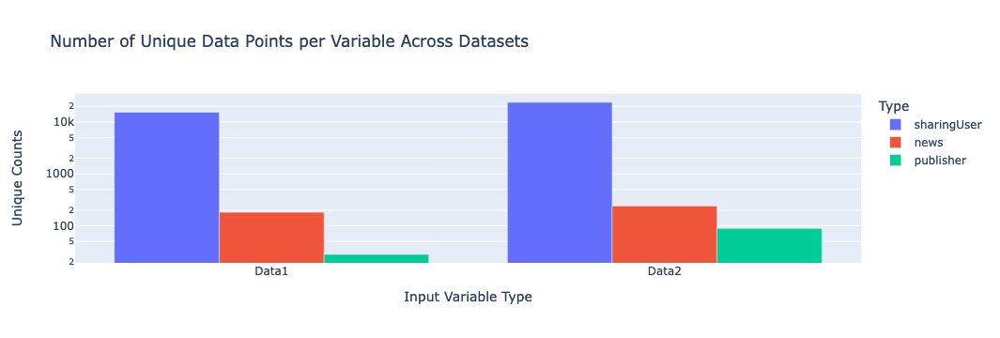

In [12]:
unique_counts_df = merged_df_grouped\
    .melt(
        id_vars="dataset",
        value_vars=["news", "sharingUser", "publisher"]
    )\
    .groupby(["dataset", "variable"])["value"]\
    .apply(lambda x: x.nunique())\
    .reset_index()\
    .rename(columns={
        "dataset": "Dataset",
        "variable": "Type",
        "value": "Unique counts"
    })

px.bar(
    data_frame=unique_counts_df,
    x="Dataset",
    y="Unique counts",
    color="Type",
    log_y=True,
    barmode="group",
    category_orders={
        "Type": ["sharingUser", "news", "publisher"]
    }, title="Number of Unique Data Points per Variable Across Datasets"
).update_layout(
    xaxis_title="Input Variable Type", yaxis_title="Unique Counts"
)

Hypothesis: Users contribute the most during the optimization process in producing a veracity score for a news 

## News and users analysis

In [13]:
merged_df_grouped["timesShared"].unique()

array([ 1,  2,  3,  5,  4,  8,  6, 11,  7,  9, 43, 10, 16, 67, 21, 14, 15,
       25, 30, 40, 28, 38, 51, 13, 18, 12, 41])

### Descriptive analysis of news

In [14]:
news_df = merged_df_grouped\
    .groupby(["news", "groundtruth","dataset"], as_index=False)\
    .sum("timesShared")

news_df

,news,groundtruth,dataset,timesShared
0,BuzzfeedNews1,Real,Data1,13
1,BuzzfeedNews10,Real,Data1,148
2,BuzzfeedNews100,Fake,Data1,17
3,BuzzfeedNews101,Fake,Data1,205
4,BuzzfeedNews102,Fake,Data1,128
...,...,...,...,...
417,PolitifactNews95,Real,Data2,129
418,PolitifactNews96,Real,Data2,5
419,PolitifactNews97,Real,Data2,207
420,PolitifactNews98,Real,Data2,62


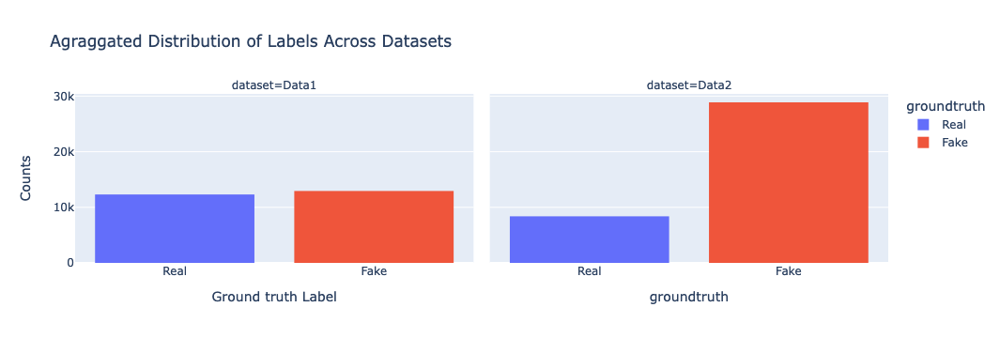

In [15]:
px.histogram(
    news_df,
    x="groundtruth",
    y="timesShared",
    color="groundtruth",
    facet_col="dataset",
    category_orders={
        "groundtruth": ["Real", "Fake"]
    },
title="Agraggated Distribution of Labels Across Datasets"
).update_layout(
    xaxis_title="Ground truth Label", yaxis_title="Counts"
)

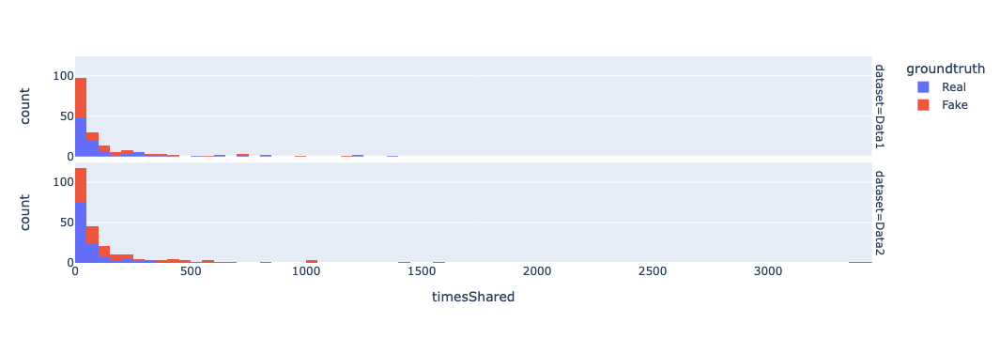

In [16]:
fig = px.histogram(news_df, x="timesShared", color="groundtruth", facet_row="dataset",
    hover_data=["news"],category_orders={
        "groundtruth": ["Real", "Fake"]},
    nbins=100)
fig.show()

In [17]:
news_df

,news,groundtruth,dataset,timesShared
0,BuzzfeedNews1,Real,Data1,13
1,BuzzfeedNews10,Real,Data1,148
2,BuzzfeedNews100,Fake,Data1,17
3,BuzzfeedNews101,Fake,Data1,205
4,BuzzfeedNews102,Fake,Data1,128
...,...,...,...,...
417,PolitifactNews95,Real,Data2,129
418,PolitifactNews96,Real,Data2,5
419,PolitifactNews97,Real,Data2,207
420,PolitifactNews98,Real,Data2,62


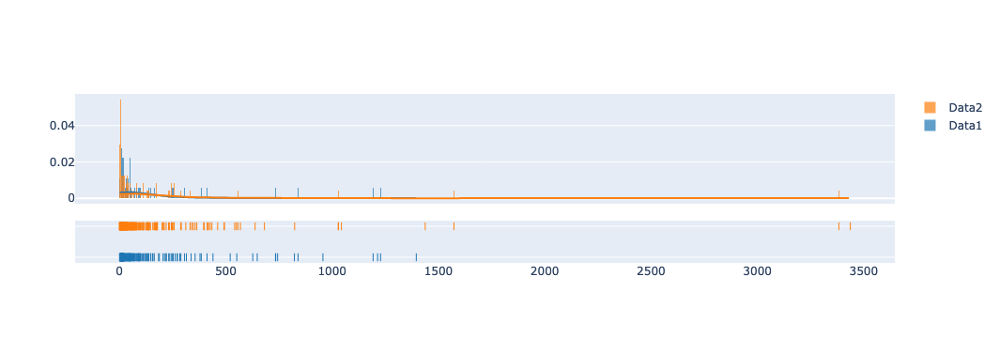

In [18]:
fig = ff.create_distplot(
    [
        news_df[news_df["dataset"] == "Data1"]["timesShared"],
        news_df[news_df["dataset"] == "Data2"]["timesShared"]
    ],
    ["Data1", "Data2"],
    # bin_size=.5
)
fig.show()

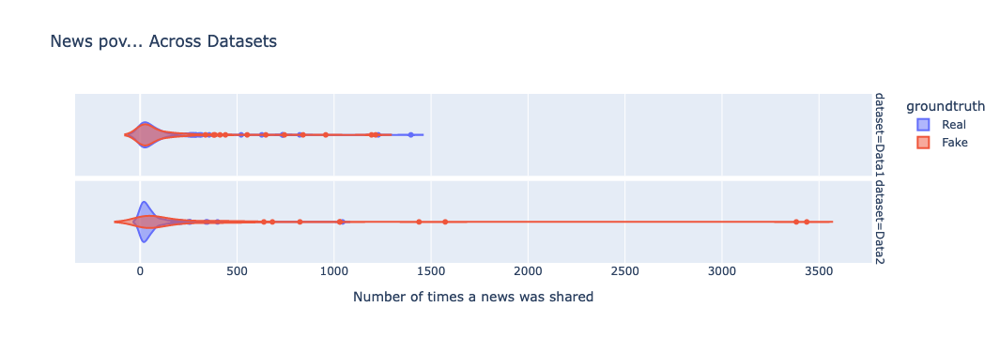

In [19]:
px.violin(
    data_frame=news_df,
    x="timesShared",
    facet_row="dataset",
    violinmode='overlay',
    color="groundtruth",category_orders={
        "groundtruth": ["Real", "Fake"]},
    hover_data=["news"],title="News pov... Across Datasets"
).update_layout(
    xaxis_title="Number of times a news was shared"
)

### Descriptive analysis of users

In [20]:
user_df = merged_df_grouped\
    .groupby(["sharingUser", "groundtruth","dataset"], as_index=False)\
    .sum("timesShared")

user_df

,sharingUser,groundtruth,dataset,timesShared
0,BuzzfeedUser1,Real,Data1,1
1,BuzzfeedUser10,Fake,Data1,3
2,BuzzfeedUser100,Real,Data1,1
3,BuzzfeedUser1000,Real,Data1,1
4,BuzzfeedUser10000,Fake,Data1,1
...,...,...,...,...
40218,PolitifactUser9995,Fake,Data2,1
40219,PolitifactUser9996,Fake,Data2,1
40220,PolitifactUser9997,Fake,Data2,1
40221,PolitifactUser9998,Fake,Data2,1


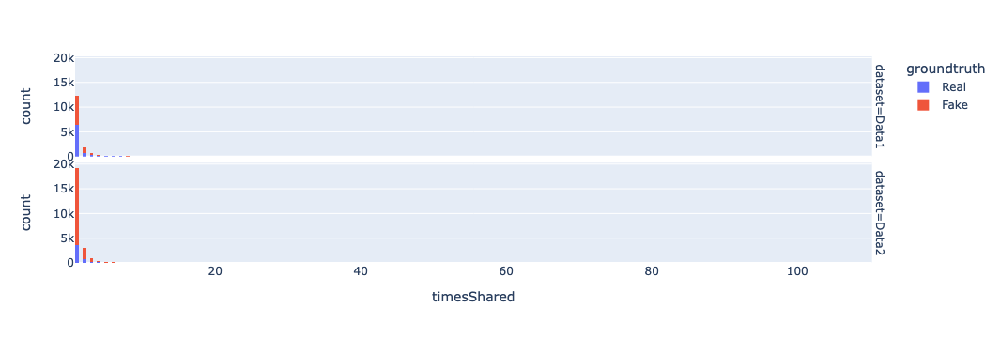

In [21]:
px.histogram(
    data_frame=user_df,
    x="timesShared",
    color="groundtruth",
    facet_row="dataset",
    hover_data=["sharingUser"],
    category_orders={
        "groundtruth": ["Real", "Fake"]},
    nbins=250
)

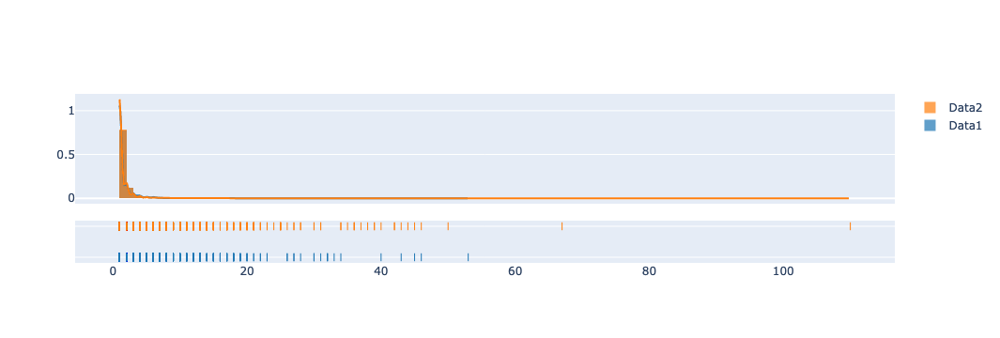

In [22]:
fig = ff.create_distplot(
    [
        user_df[user_df["dataset"] == "Data1"]["timesShared"],
        user_df[user_df["dataset"] == "Data2"]["timesShared"]
    ],
    ["Data1", "Data2"],
    # bin_size=.5
)
fig.show()

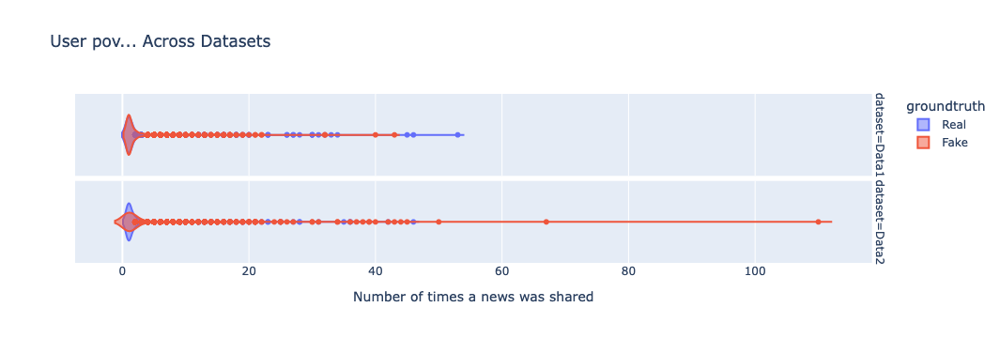

In [23]:
px.violin(
    data_frame=user_df,
    x="timesShared",
    facet_row="dataset",
    color="groundtruth",
    violinmode='overlay',
    hover_data=["sharingUser"],
    category_orders={
        "groundtruth": ["Real", "Fake"]},title="User pov... Across Datasets").update_layout(
    xaxis_title="Number of times a news was shared"
)

### Descriptive analysis of publishers

In [24]:
pub_df = merged_df_grouped\
    .groupby(["publisher", "groundtruth","dataset"], as_index=False)\
    .sum("timesShared")

pub_df

,publisher,groundtruth,dataset,timesShared
0,Publisher1,Fake,Data1,606
1,Publisher10,Fake,Data1,205
2,Publisher10,Real,Data1,10
3,Publisher10,Real,Data2,82
4,Publisher100,Fake,Data2,14
...,...,...,...,...
121,Publisher95,Fake,Data2,829
122,Publisher96,Fake,Data2,493
123,Publisher97,Fake,Data2,886
124,Publisher98,Fake,Data2,427


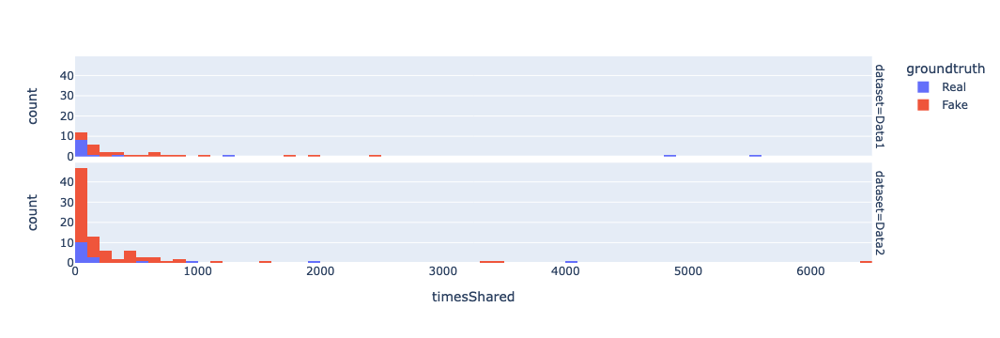

In [25]:
px.histogram(
    data_frame=pub_df,
    x="timesShared",
    color="groundtruth",
    facet_row="dataset",
    hover_data=["publisher"],
    nbins=100,
    category_orders={
        "groundtruth": ["Real", "Fake"]}
)

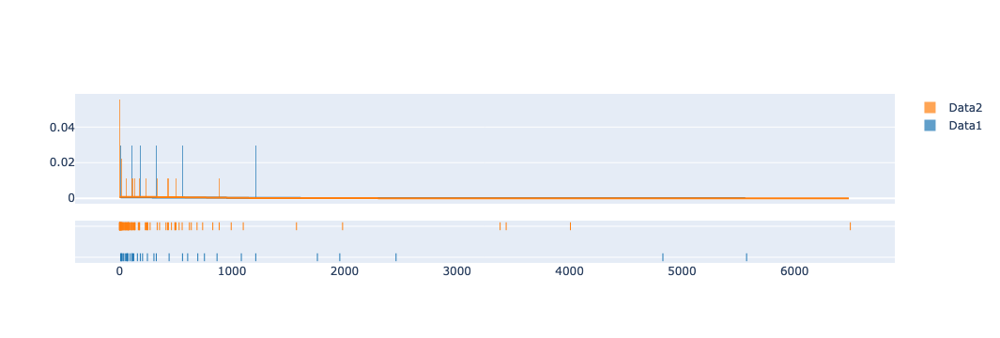

In [26]:
fig = ff.create_distplot(
    [
        pub_df[pub_df["dataset"] == "Data1"]["timesShared"],
        pub_df[pub_df["dataset"] == "Data2"]["timesShared"]
    ],
    ["Data1", "Data2"],
    # bin_size=.5
)
fig.show()

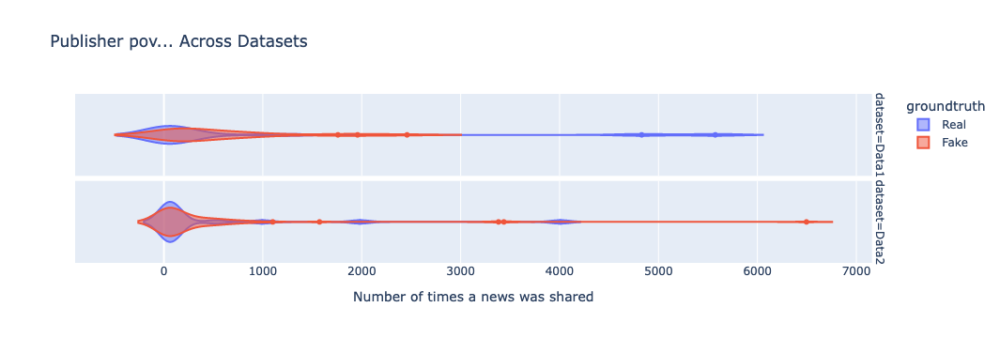

In [27]:
px.violin(
    data_frame=pub_df,
    x="timesShared",
    facet_row="dataset",
    color="groundtruth",
    violinmode='overlay',
    hover_data=["publisher"],category_orders={
        "groundtruth": ["Real", "Fake"]},title="Publisher pov... Across Datasets").update_layout(
    xaxis_title="Number of times a news was shared"
)

## Analysis of labels

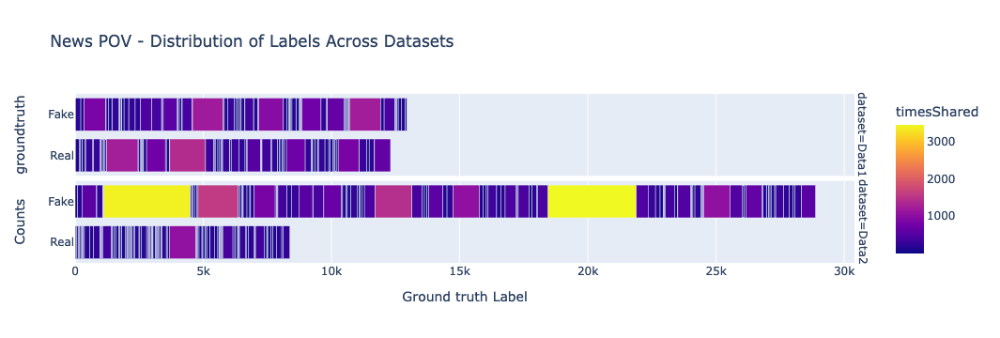

In [28]:
px.bar(
    data_frame=news_df,
    x="timesShared",
    y="groundtruth",
    facet_row="dataset",
    color="timesShared",
    color_discrete_sequence=px.colors.sequential.Plasma,
    hover_data=["news"],
title="News POV - Distribution of Labels Across Datasets"
).update_layout(
    xaxis_title="Ground truth Label", yaxis_title="Counts"  #fix this!!!!!!!!! 
)

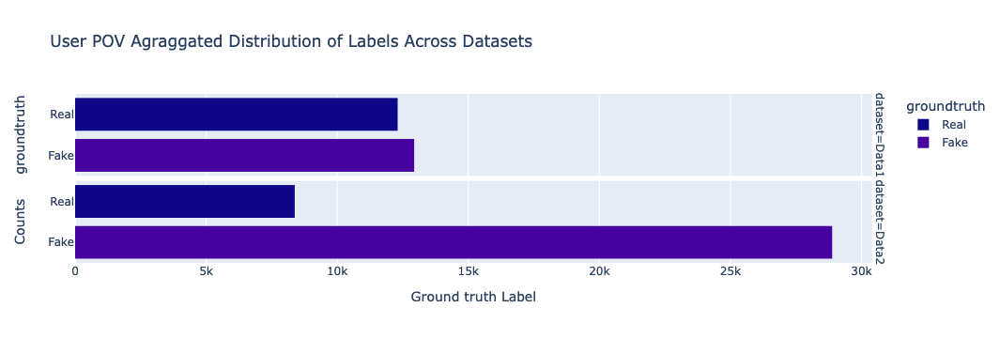

In [29]:
#%%script false --no-raise-error

# WARNING: TOO MANY USERS!
px.histogram(
    data_frame=user_df,
    x="timesShared",
    y="groundtruth",
    facet_row="dataset",
    color="groundtruth",
    color_discrete_sequence=px.colors.sequential.Plasma,
    #hover_data=["sharingUser"],
title="User POV Agraggated Distribution of Labels Across Datasets"
).update_layout(
    xaxis_title="Ground truth Label", yaxis_title="Counts"    #fix this!!!!!!!!! 
)

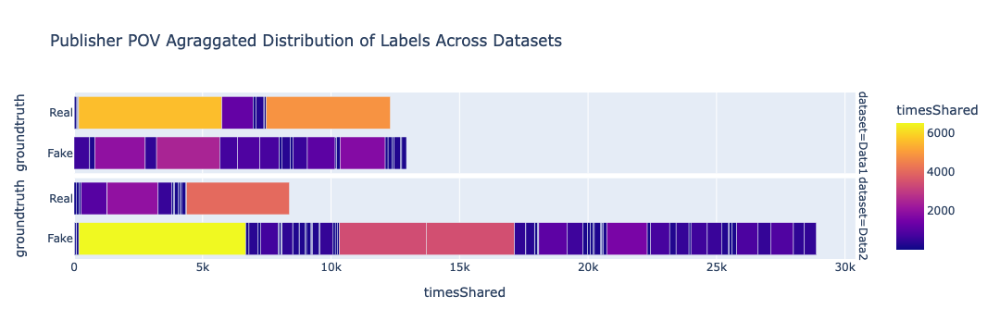

In [139]:
px.bar(
    data_frame=pub_df,
    x="timesShared",
    y="groundtruth",
    facet_row="dataset",
    color="timesShared",
    color_discrete_sequence=px.colors.sequential.Plasma,
    hover_data=["publisher"],title="Publisher POV Agraggated Distribution of Labels Across Datasets"
)

## Publisher analysis

There are a few overrepresented publishers according to the barplot:
* **Real:** Publisher9 and 19 contribute more than half to the Real label
* **Fake:** Publisher11, 13, 60 and 61 contribute almost a quarter of the total shared news in the Fake label

In [31]:
over_pub_real = [
    "Publisher9",
    "Publisher19"
]
over_pub_fake = [
    "Publisher11",
    "Publisher13",
    "Publisher28",
    "Publisher60",
    "Publisher61"
]

In [32]:
merged_df_grouped

,news,sharingUser,publisher,groundtruth,dataset,timesShared
0,BuzzfeedNews1,BuzzfeedUser10043,Publisher12,Real,Data1,1
1,BuzzfeedNews1,BuzzfeedUser10351,Publisher12,Real,Data1,1
2,BuzzfeedNews1,BuzzfeedUser11539,Publisher12,Real,Data1,1
3,BuzzfeedNews1,BuzzfeedUser11887,Publisher12,Real,Data1,1
4,BuzzfeedNews1,BuzzfeedUser12499,Publisher12,Real,Data1,1
...,...,...,...,...,...,...
55565,PolitifactNews99,PolitifactUser9724,Publisher17,Real,Data2,1
55566,PolitifactNews99,PolitifactUser9809,Publisher17,Real,Data2,1
55567,PolitifactNews99,PolitifactUser9832,Publisher17,Real,Data2,1
55568,PolitifactNews99,PolitifactUser9906,Publisher17,Real,Data2,1


In [33]:
# Check which users are being targeted by the overrepresented "real" publishers

over_pub_real_df = merged_df_grouped[
    merged_df_grouped["publisher"].isin(over_pub_real)
]

over_pub_real_df = over_pub_real_df["sharingUser"]\
    .value_counts()\
    .to_frame()\
    .reset_index()\
    .rename(columns={
        "sharingUser": "Counts",
        "index": "sharingUser"
    })

over_pub_real_df

,sharingUser,Counts
0,BuzzfeedUser14404,45
1,PolitifactUser11690,37
2,PolitifactUser10374,30
3,BuzzfeedUser5392,28
4,BuzzfeedUser6611,28
...,...,...
10417,BuzzfeedUser4856,1
10418,BuzzfeedUser4867,1
10419,BuzzfeedUser4926,1
10420,BuzzfeedUser4945,1


In [34]:
# Check which users are being targeted by the overrepresented "real" publishers

over_pub_real_df_dataset = merged_df_grouped[
    merged_df_grouped["publisher"].isin(over_pub_real)
]

over_pub_real_df_dataset = over_pub_real_df_dataset\
    .value_counts(subset=["sharingUser", "dataset"])\
    .to_frame()\
    .reset_index()\
    .rename(columns={0: "Counts"})

over_pub_real_df_dataset

,sharingUser,dataset,Counts
0,BuzzfeedUser14404,Data1,45
1,PolitifactUser11690,Data2,37
2,PolitifactUser10374,Data2,30
3,BuzzfeedUser5392,Data1,28
4,BuzzfeedUser6611,Data1,28
...,...,...,...
10417,BuzzfeedUser5401,Data1,1
10418,BuzzfeedUser5400,Data1,1
10419,BuzzfeedUser54,Data1,1
10420,BuzzfeedUser5393,Data1,1


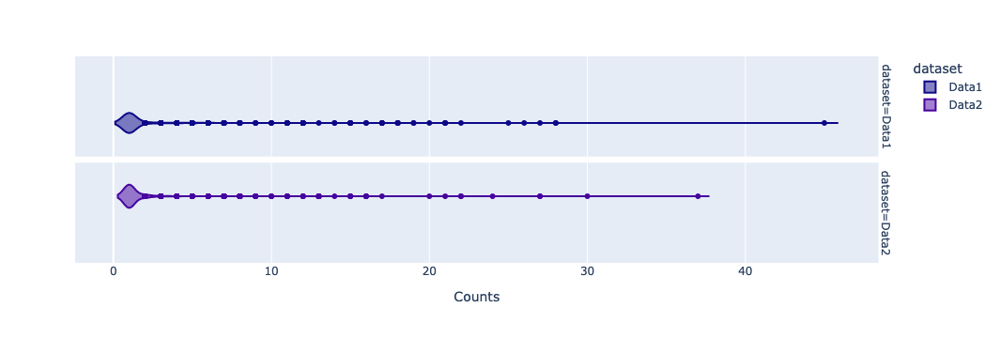

In [35]:
px.violin(
    data_frame=over_pub_real_df_dataset,
    facet_row="dataset",
    color="dataset",
    color_discrete_sequence=px.colors.sequential.Plasma,
    x="Counts"
)

In [36]:
# Check which users are being targeted by the overrepresented "fake" publishers

over_pub_fake_df_dataset= merged_df_grouped[
    merged_df_grouped["publisher"].isin(over_pub_fake)
]

over_pub_fake_df_dataset = over_pub_fake_df_dataset\
    .value_counts(subset=["sharingUser", "dataset"])\
    .to_frame()\
    .reset_index()\
    .rename(columns={0: "Counts"})

over_pub_fake_df_dataset

,sharingUser,dataset,Counts
0,PolitifactUser12526,Data2,12
1,PolitifactUser6900,Data2,11
2,PolitifactUser21794,Data2,10
3,BuzzfeedUser13185,Data1,9
4,BuzzfeedUser5194,Data1,9
...,...,...,...
15196,PolitifactUser11680,Data2,1
15197,PolitifactUser11681,Data2,1
15198,PolitifactUser11682,Data2,1
15199,PolitifactUser11685,Data2,1


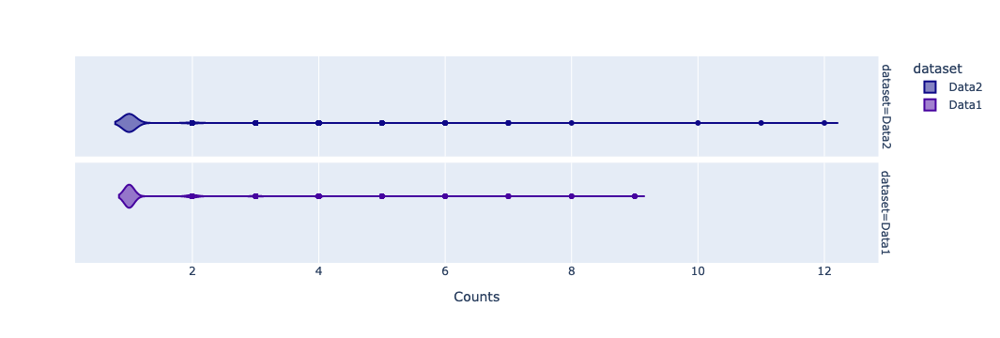

In [37]:
px.violin(
    data_frame=over_pub_fake_df_dataset,
    facet_row="dataset",
    color="dataset",
    color_discrete_sequence=px.colors.sequential.Plasma,
    x="Counts"
)

## Overrepresentation detection

In [38]:
def calculate_enrichment(
    x: float,
    q_thr: float
) -> float:
    """Calculates enrichment as the percentage of change between the instance
    counts and the counts for the specified threshold.

    For x < q_thr, the result is a negative percentage (it is not enriched).
    For x > q_thr, the percentage is positive and, thus, the instance shows enrichment over the given threshold.

    For example, for x=190 counts and q_thr=150 counts, the instance will have an enrichment of: 100 * (190 - 150) / 150 = 26.67

    On the other hand, for x=90 counts and q_thr=150 counts, the instance will
    have a enrichment of: 100 * (90 - 150) / 150 = -40

    :param x: The counts for the given instance.
    :type x: float
    :param q_thr: The counts corresponding to the quantile threshold.
    :type q_thr: float
    :returns: The enrichment percentage.
    :rtype: float
    """
    return 100 * (x - q_thr) / q_thr


def calculate_enrichment_per_instance(
    value_counts: pd.Series,
    thr: float
) -> pd.DataFrame:
    """Calculates overrepresentation for each instance.

    :param value_counts: The counts for all the given instances.
    :type value_counts: pd.Series
    :param thr: The threshold percentage to define enrichment.
    :type thr: float
    :returns: The calculated enrichment for all instances.
    :rtype: pd.DataFrame
    """
    # Get actual value for quantile threshold
    quantile = value_counts.quantile(q=thr)

    # Format value counts
    value_counts = value_counts\
        .reset_index(drop=False)\
        .rename(columns={
            value_counts.name: "RawCounts",
            "index": value_counts.name
        })

    # Add metadata
    value_counts["MeasureID"] = 1
    value_counts["MeasureName"] = "Enrichment"
    value_counts["MeasureThreshold"] = thr
    value_counts["MeasureThresholdCounts"] = quantile

    # Calculate metric
    value_counts["MeasureValue"] = value_counts["RawCounts"].apply(
            lambda x: calculate_enrichment(
                x=x,
                q_thr=quantile
            )
        )

    return value_counts

## Buzzfeed Data

In [39]:
enrichment_df_news = calculate_enrichment_per_instance(
        value_counts=merged_df_grouped[merged_df_grouped["dataset"] == "Data1"]["news"].value_counts(),
        thr=0.9
    )

In [40]:
enrichment_df_news

,news,RawCounts,MeasureID,MeasureName,MeasureThreshold,MeasureThresholdCounts,MeasureValue
0,BuzzfeedNews40,1197,1,Enrichment,0.9,331.9,260.650798
1,BuzzfeedNews26,1134,1,Enrichment,0.9,331.9,241.669177
2,BuzzfeedNews179,1060,1,Enrichment,0.9,331.9,219.373305
3,BuzzfeedNews135,1020,1,Enrichment,0.9,331.9,207.321482
4,BuzzfeedNews150,935,1,Enrichment,0.9,331.9,181.711359
...,...,...,...,...,...,...,...
177,BuzzfeedNews129,2,1,Enrichment,0.9,331.9,-99.397409
178,BuzzfeedNews42,2,1,Enrichment,0.9,331.9,-99.397409
179,BuzzfeedNews117,2,1,Enrichment,0.9,331.9,-99.397409
180,BuzzfeedNews60,1,1,Enrichment,0.9,331.9,-99.698704


In [41]:
enrichment_df_news['RawCounts'].describe()

count     182.000000
mean      125.159341
std       215.366710
min         1.000000
25%        13.000000
50%        42.500000
75%       125.500000
max      1197.000000
Name: RawCounts, dtype: float64

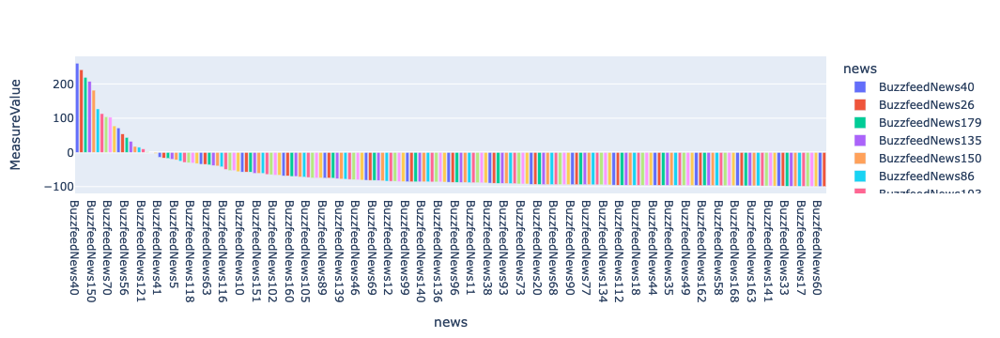

In [43]:
fig = px.bar(
    enrichment_df_news,
    y="MeasureValue",
    x="news",
    color="news"
)
fig.show()

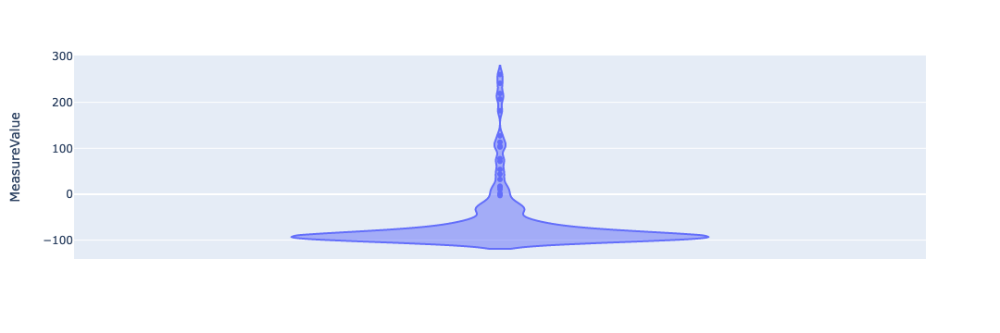

In [129]:
fig = px.violin(
    enrichment_df_news,
    y="MeasureValue",
)
fig.show()

In [44]:
enrichment_df_pub = calculate_enrichment_per_instance(
    value_counts=merged_df_grouped[merged_df_grouped["dataset"] == "Data1"]["publisher"].value_counts(),
    thr=0.90
)

In [45]:
enrichment_df_pub['RawCounts'].describe()

count      28.000000
mean      813.535714
std      1242.812685
min        14.000000
25%       114.250000
50%       351.500000
75%       793.750000
max      5145.000000
Name: RawCounts, dtype: float64

In [46]:
enrichment_df_pub

,publisher,RawCounts,MeasureID,MeasureName,MeasureThreshold,MeasureThresholdCounts,MeasureValue
0,Publisher19,5145,1,Enrichment,0.9,1881.7,173.422969
1,Publisher9,4274,1,Enrichment,0.9,1881.7,127.135037
2,Publisher13,2217,1,Enrichment,0.9,1881.7,17.818993
3,Publisher11,1738,1,Enrichment,0.9,1881.7,-7.636711
4,Publisher28,1673,1,Enrichment,0.9,1881.7,-11.091035
5,Publisher2,1113,1,Enrichment,0.9,1881.7,-40.851358
6,Publisher24,925,1,Enrichment,0.9,1881.7,-50.842323
7,Publisher17,750,1,Enrichment,0.9,1881.7,-60.142424
8,Publisher16,716,1,Enrichment,0.9,1881.7,-61.949301
9,Publisher14,620,1,Enrichment,0.9,1881.7,-67.051071


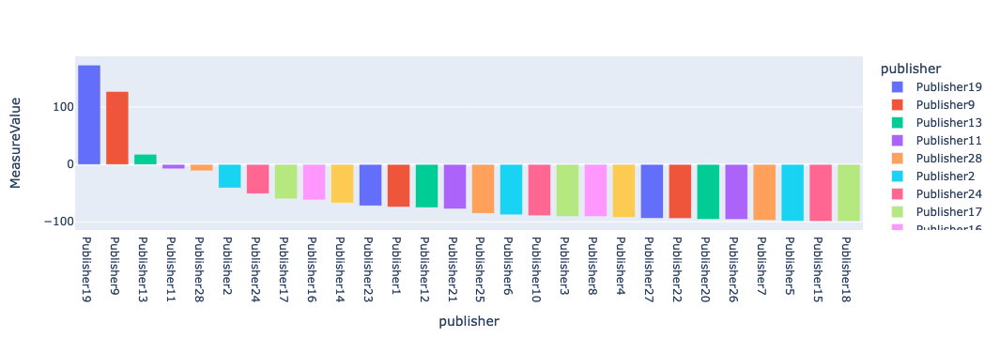

In [48]:
fig = px.bar(
    enrichment_df_pub,
    y="MeasureValue",
    x="publisher",
    color="publisher"
)
fig.show()

In [49]:
enrichment_df_pub['isOverrepresented'] = ["False" if x <= 1881.7 else "True" for x in enrichment_df_pub['RawCounts']]

In [50]:
enrichment_df_user = calculate_enrichment_per_instance(
    value_counts=merged_df_grouped[merged_df_grouped["dataset"] == "Data1"]["sharingUser"].value_counts(),
    thr=0.90
)

In [51]:
enrichment_df_user

,sharingUser,RawCounts,MeasureID,MeasureName,MeasureThreshold,MeasureThresholdCounts,MeasureValue
0,BuzzfeedUser14404,48,1,Enrichment,0.9,2.0,2300.0
1,BuzzfeedUser2671,35,1,Enrichment,0.9,2.0,1650.0
2,BuzzfeedUser5392,32,1,Enrichment,0.9,2.0,1500.0
3,BuzzfeedUser6611,28,1,Enrichment,0.9,2.0,1300.0
4,BuzzfeedUser4463,28,1,Enrichment,0.9,2.0,1300.0
...,...,...,...,...,...,...,...
15252,BuzzfeedUser12414,1,1,Enrichment,0.9,2.0,-50.0
15253,BuzzfeedUser12809,1,1,Enrichment,0.9,2.0,-50.0
15254,BuzzfeedUser12925,1,1,Enrichment,0.9,2.0,-50.0
15255,BuzzfeedUser12937,1,1,Enrichment,0.9,2.0,-50.0


In [52]:
enrichment_df_user['RawCounts'].describe()

count    15257.000000
mean         1.493020
std          1.689357
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         48.000000
Name: RawCounts, dtype: float64

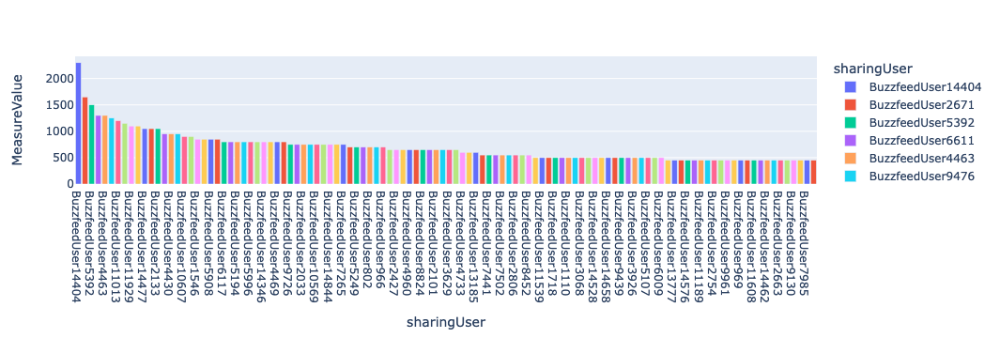

In [54]:
fig = px.bar(
    enrichment_df_user[enrichment_df_user["RawCounts"] > 10.0],
    y="MeasureValue",
    x="sharingUser",
    color="sharingUser"
)
fig.show()

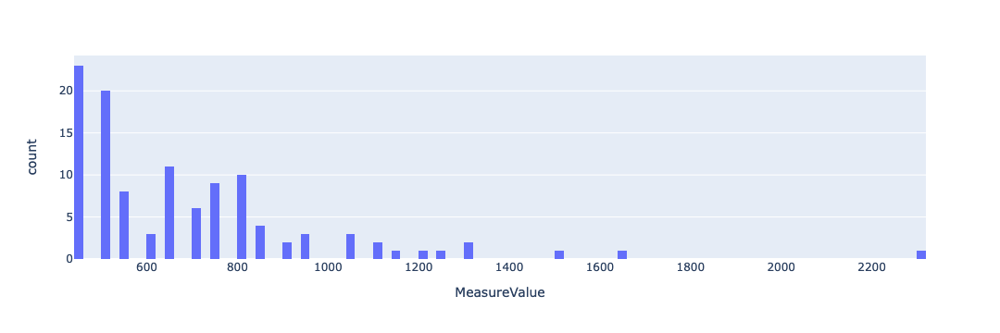

In [138]:
fig = px.histogram(
    enrichment_df_user[enrichment_df_user["RawCounts"] > 10.0],
    x="MeasureValue",
    nbins=150
)
fig.show()

In [55]:
# Rename ID to fit long format
enrichment_df_user.rename(columns={"sharingUser": "ID"}, inplace=True)
enrichment_df_news.rename(columns={"news": "ID"}, inplace=True)
enrichment_df_pub.rename(columns={"publisher": "ID"}, inplace=True)

# Add extra column to indicate type of data
enrichment_df_user["Type"] = "User"
enrichment_df_news["Type"] = "News"
enrichment_df_pub["Type"] = "Publisher"

# Concatenate enrichment measurements for users, news and publishers
enrichment_df_all = pd.concat(
    [
        enrichment_df_user,
        enrichment_df_news,
        enrichment_df_pub
    ],
    axis=0,
    ignore_index=True
)
enrichment_df_all

,ID,RawCounts,MeasureID,MeasureName,MeasureThreshold,MeasureThresholdCounts,MeasureValue,Type,isOverrepresented
0,BuzzfeedUser14404,48,1,Enrichment,0.9,2.0,2300.000000,User,NaN
1,BuzzfeedUser2671,35,1,Enrichment,0.9,2.0,1650.000000,User,NaN
2,BuzzfeedUser5392,32,1,Enrichment,0.9,2.0,1500.000000,User,NaN
3,BuzzfeedUser6611,28,1,Enrichment,0.9,2.0,1300.000000,User,NaN
4,BuzzfeedUser4463,28,1,Enrichment,0.9,2.0,1300.000000,User,NaN
...,...,...,...,...,...,...,...,...,...
15462,Publisher26,78,1,Enrichment,0.9,1881.7,-95.854812,Publisher,False
15463,Publisher7,49,1,Enrichment,0.9,1881.7,-97.395972,Publisher,False
15464,Publisher5,30,1,Enrichment,0.9,1881.7,-98.405697,Publisher,False
15465,Publisher15,17,1,Enrichment,0.9,1881.7,-99.096562,Publisher,False


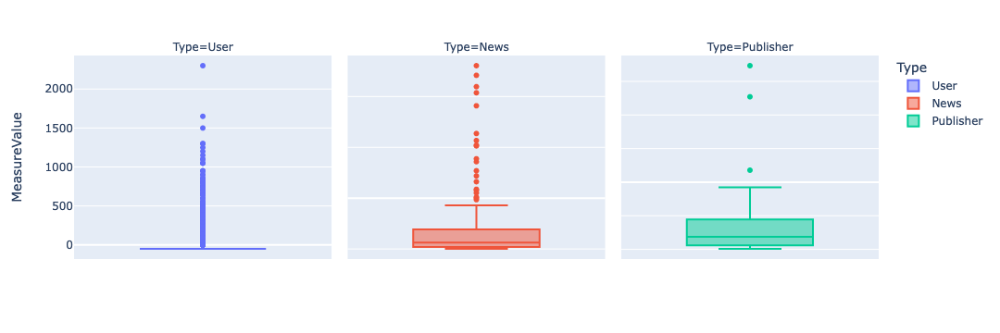

In [56]:
fig = px.box(
    enrichment_df_all,
    y="MeasureValue",
    facet_col="Type",
    color="Type",
    boxmode="overlay"
    # points='all'
)

# fig.update_traces(type="log", col=1)
fig.update_yaxes(matches=None)
fig.show()

fisher test 

In [57]:
user_cred_df

,user,naiveUserCred
0,BuzzfeedUser67,0.0
1,BuzzfeedUser901,0.0
2,BuzzfeedUser2863,0.0
3,BuzzfeedUser3967,0.0
4,BuzzfeedUser4001,0.0
...,...,...
39117,PolitifactUser9168,1.0
39118,PolitifactUser16497,1.0
39119,PolitifactUser11946,1.0
39120,PolitifactUser14243,0.0


In [58]:
enrichment_df_user

,ID,RawCounts,MeasureID,MeasureName,MeasureThreshold,MeasureThresholdCounts,MeasureValue,Type
0,BuzzfeedUser14404,48,1,Enrichment,0.9,2.0,2300.0,User
1,BuzzfeedUser2671,35,1,Enrichment,0.9,2.0,1650.0,User
2,BuzzfeedUser5392,32,1,Enrichment,0.9,2.0,1500.0,User
3,BuzzfeedUser6611,28,1,Enrichment,0.9,2.0,1300.0,User
4,BuzzfeedUser4463,28,1,Enrichment,0.9,2.0,1300.0,User
...,...,...,...,...,...,...,...,...
15252,BuzzfeedUser12414,1,1,Enrichment,0.9,2.0,-50.0,User
15253,BuzzfeedUser12809,1,1,Enrichment,0.9,2.0,-50.0,User
15254,BuzzfeedUser12925,1,1,Enrichment,0.9,2.0,-50.0,User
15255,BuzzfeedUser12937,1,1,Enrichment,0.9,2.0,-50.0,User


## Fisher's exact test

### News

In [59]:
news_over_df = pd.read_csv("data/query6.csv")

news_over_df["news"] = news_over_df["news"].str.split("/").str[-1]

news_over_df

,news,isOverrepresented
0,BuzzfeedNews4,False
1,BuzzfeedNews5,False
2,BuzzfeedNews28,False
3,BuzzfeedNews30,False
4,BuzzfeedNews31,False
...,...,...
177,BuzzfeedNews52,False
178,BuzzfeedNews40,True
179,BuzzfeedNews74,False
180,BuzzfeedNews58,False


In [60]:
# Get all info for news
buzzfeed_df = pd.merge(
    left=merged_df_grouped[["news", "groundtruth"]].drop_duplicates(), # Get unique news
    right=news_over_df,
    on="news",
    how="inner"
)
buzzfeed_df

,news,groundtruth,isOverrepresented
0,BuzzfeedNews1,Real,False
1,BuzzfeedNews10,Real,False
2,BuzzfeedNews100,Fake,False
3,BuzzfeedNews101,Fake,False
4,BuzzfeedNews102,Fake,False
...,...,...,...
177,BuzzfeedNews95,Fake,False
178,BuzzfeedNews96,Fake,False
179,BuzzfeedNews97,Fake,False
180,BuzzfeedNews98,Fake,False


In [61]:
buzzfeed_crosstab = pd.crosstab(
    buzzfeed_df["groundtruth"],
    buzzfeed_df["isOverrepresented"]
)
buzzfeed_crosstab

isOverrepresented,False,True
groundtruth,,
Fake,80,11
Real,83,8


In [62]:
from scipy import stats


# There is no statistical significance for the test,
# therefore groundtruth and isOverrepresented are
# independent (i.e. the fact that being overrepresented
# xdoes not condition being fake or real)
stats.fisher_exact(
    table=buzzfeed_crosstab.to_numpy(),
    alternative="two-sided"
)

SignificanceResult(statistic=0.7009857612267251, pvalue=0.6288265285956871)

### Users

In [63]:
users_over_df = pd.read_csv("data/query7.csv")

users_over_df["user"] = users_over_df["user"].str.split("/").str[-1]

users_over_df

,user,isOverrepresented
0,BuzzfeedUser1,False
1,BuzzfeedUser2,False
2,BuzzfeedUser3,True
3,BuzzfeedUser4,False
4,BuzzfeedUser5,False
...,...,...
15434,BuzzfeedNews52,False
15435,BuzzfeedNews40,True
15436,BuzzfeedNews74,False
15437,BuzzfeedNews58,False


In [64]:
buzzfeed_user_df = pd.merge(
    left=user_cred_df[["user", "naiveUserCred"]].drop_duplicates(), # Get unique news
    right=users_over_df,
    on="user",
    how="inner"
)
buzzfeed_user_df

,user,naiveUserCred,isOverrepresented
0,BuzzfeedUser67,0.0,True
1,BuzzfeedUser901,0.0,True
2,BuzzfeedUser2863,0.0,True
3,BuzzfeedUser3967,0.0,True
4,BuzzfeedUser4001,0.0,True
...,...,...,...
15252,BuzzfeedUser14856,0.0,False
15253,BuzzfeedUser14858,0.0,False
15254,BuzzfeedUser14940,0.0,False
15255,BuzzfeedUser15019,0.0,False


In [65]:
buzzfeed_user_df['naiveUserCred'].unique()

buzzfeed_user_df['UserCred'] = ["NotCredible" if x <= 0.5 else "Credible" for x in buzzfeed_user_df['naiveUserCred']]

In [66]:
buzzfeed_user_df

,user,naiveUserCred,isOverrepresented,UserCred
0,BuzzfeedUser67,0.0,True,NotCredible
1,BuzzfeedUser901,0.0,True,NotCredible
2,BuzzfeedUser2863,0.0,True,NotCredible
3,BuzzfeedUser3967,0.0,True,NotCredible
4,BuzzfeedUser4001,0.0,True,NotCredible
...,...,...,...,...
15252,BuzzfeedUser14856,0.0,False,NotCredible
15253,BuzzfeedUser14858,0.0,False,NotCredible
15254,BuzzfeedUser14940,0.0,False,NotCredible
15255,BuzzfeedUser15019,0.0,False,NotCredible


In [67]:
buzzfeed_user_crosstab = pd.crosstab(
    buzzfeed_user_df["UserCred"],
    buzzfeed_user_df["isOverrepresented"]
)
buzzfeed_user_crosstab

isOverrepresented,False,True
UserCred,,
Credible,5878,1757
NotCredible,6377,1245


In [68]:
stats.fisher_exact(
    table=buzzfeed_user_crosstab.to_numpy(),
    alternative="two-sided"
)

SignificanceResult(statistic=0.6531467266979039, pvalue=2.8975723951880104e-25)

In [69]:
from scipy.stats.contingency import odds_ratio

odds_ratio(buzzfeed_user_crosstab.to_numpy())

OddsRatioResult(statistic=0.6531649443350745)

### Publishers

In [70]:
enrichment_df_pub

,ID,RawCounts,MeasureID,MeasureName,MeasureThreshold,MeasureThresholdCounts,MeasureValue,isOverrepresented,Type
0,Publisher19,5145,1,Enrichment,0.9,1881.7,173.422969,True,Publisher
1,Publisher9,4274,1,Enrichment,0.9,1881.7,127.135037,True,Publisher
2,Publisher13,2217,1,Enrichment,0.9,1881.7,17.818993,True,Publisher
3,Publisher11,1738,1,Enrichment,0.9,1881.7,-7.636711,False,Publisher
4,Publisher28,1673,1,Enrichment,0.9,1881.7,-11.091035,False,Publisher
5,Publisher2,1113,1,Enrichment,0.9,1881.7,-40.851358,False,Publisher
6,Publisher24,925,1,Enrichment,0.9,1881.7,-50.842323,False,Publisher
7,Publisher17,750,1,Enrichment,0.9,1881.7,-60.142424,False,Publisher
8,Publisher16,716,1,Enrichment,0.9,1881.7,-61.949301,False,Publisher
9,Publisher14,620,1,Enrichment,0.9,1881.7,-67.051071,False,Publisher


## User profiles

### Bit vectors

In [71]:
merged_df_grouped

,news,sharingUser,publisher,groundtruth,dataset,timesShared
0,BuzzfeedNews1,BuzzfeedUser10043,Publisher12,Real,Data1,1
1,BuzzfeedNews1,BuzzfeedUser10351,Publisher12,Real,Data1,1
2,BuzzfeedNews1,BuzzfeedUser11539,Publisher12,Real,Data1,1
3,BuzzfeedNews1,BuzzfeedUser11887,Publisher12,Real,Data1,1
4,BuzzfeedNews1,BuzzfeedUser12499,Publisher12,Real,Data1,1
...,...,...,...,...,...,...
55565,PolitifactNews99,PolitifactUser9724,Publisher17,Real,Data2,1
55566,PolitifactNews99,PolitifactUser9809,Publisher17,Real,Data2,1
55567,PolitifactNews99,PolitifactUser9832,Publisher17,Real,Data2,1
55568,PolitifactNews99,PolitifactUser9906,Publisher17,Real,Data2,1


In [159]:
# Select dataset
bit_matrix_buzz = merged_df_grouped[
    merged_df_grouped["dataset"] == "Data1"
]

# Create the matrix
bit_matrix_buzz = bit_matrix_buzz.pivot(
    index="sharingUser",
    columns="news",
    values="timesShared"
)

# Fill NaNs with zeroes
bit_matrix_buzz = bit_matrix_buzz\
    .fillna(0.0)

# To get similar users that shared at least once the same piece of news,
# replace all non-zero values by 1. Otherwise, leave it unchanged
# bit_matrix_buzz = bit_matrix_buzz.where(
#     cond=bit_matrix_buzz == 0.0,
#     other=1.0
# )

# Remove users with onyl one piece of news
bit_matrix_buzz = bit_matrix_buzz[bit_matrix_buzz.sum(axis=1) > 1]

bit_matrix_buzz

news,BuzzfeedNews1,BuzzfeedNews10,BuzzfeedNews100,BuzzfeedNews101,BuzzfeedNews102,BuzzfeedNews103,BuzzfeedNews104,BuzzfeedNews105,BuzzfeedNews106,BuzzfeedNews107,...,BuzzfeedNews90,BuzzfeedNews91,BuzzfeedNews92,BuzzfeedNews93,BuzzfeedNews94,BuzzfeedNews95,BuzzfeedNews96,BuzzfeedNews97,BuzzfeedNews98,BuzzfeedNews99
sharingUser,,,,,,,,,,,,,,,,,,,,,
BuzzfeedUser10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BuzzfeedUser10005,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BuzzfeedUser1001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
BuzzfeedUser10010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BuzzfeedUser10014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BuzzfeedUser9984,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BuzzfeedUser9989,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BuzzfeedUser9992,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


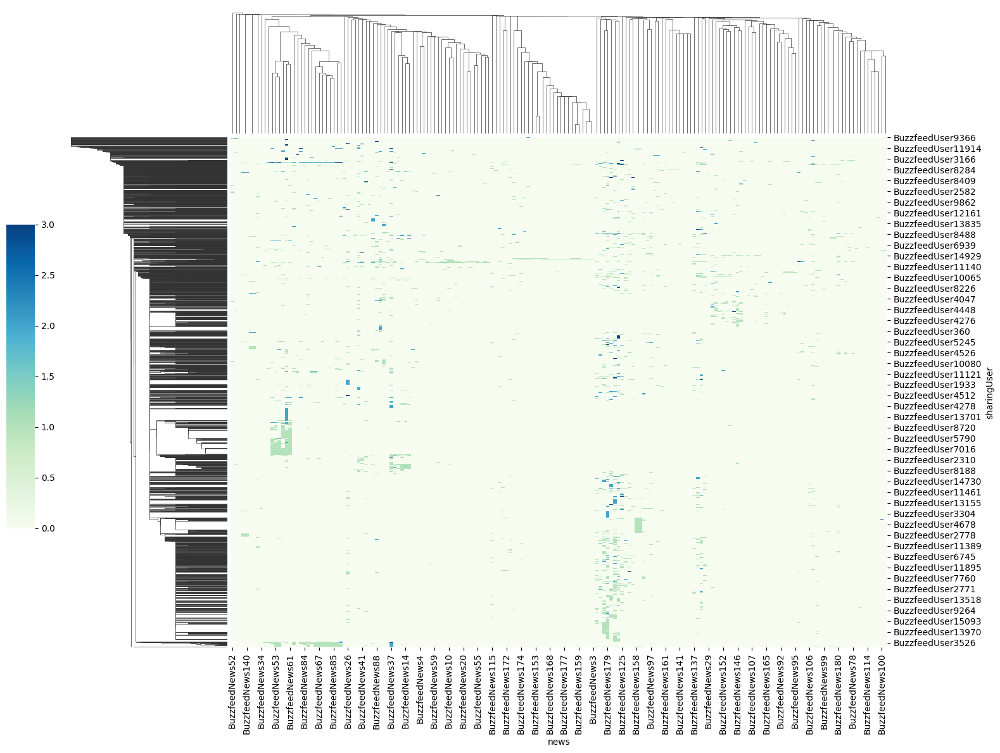

In [275]:
# WARNING: vmax is set as the number of maximum times a piece of news has been shared, change accordingly!

import seaborn as sns

h = sns.clustermap(
    bit_matrix_buzz,
    method="single",
    metric="jaccard",
    row_cluster=True,
    figsize=(15, 12),
    # dendrogram_ratio=(.1, .2),
    cbar_pos=(-0.05, .3, .03, .4),
    cmap="GnBu",
    vmin=0,
    vmax=3
)

In [189]:
# Subset by users with more than 10 shared news
bit_matrix_buzz_subset = bit_matrix_buzz[bit_matrix_buzz.sum(axis=1) > 10]

# Add ground truth label
bit_matrix_buzz_subset = pd.merge(
    left=bit_matrix_buzz_subset.T.reset_index(),
    right=merged_df_grouped[["news", "groundtruth"]].drop_duplicates(),
    on="news",
    how="left"
)

bit_matrix_buzz_subset = bit_matrix_buzz_subset.set_index("news")
bit_matrix_buzz_subset

,BuzzfeedUser10005,BuzzfeedUser10054,BuzzfeedUser10086,BuzzfeedUser10167,BuzzfeedUser10178,BuzzfeedUser10453,BuzzfeedUser10569,BuzzfeedUser10607,BuzzfeedUser107,BuzzfeedUser10714,...,BuzzfeedUser9585,BuzzfeedUser966,BuzzfeedUser969,BuzzfeedUser9701,BuzzfeedUser9726,BuzzfeedUser9848,BuzzfeedUser9961,BuzzfeedUser9966,BuzzfeedUser9997,groundtruth
news,,,,,,,,,,,,,,,,,,,,,
BuzzfeedNews1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Real
BuzzfeedNews10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Real
BuzzfeedNews100,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Fake
BuzzfeedNews101,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Fake
BuzzfeedNews102,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BuzzfeedNews95,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Fake
BuzzfeedNews96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,Fake
BuzzfeedNews97,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,Fake


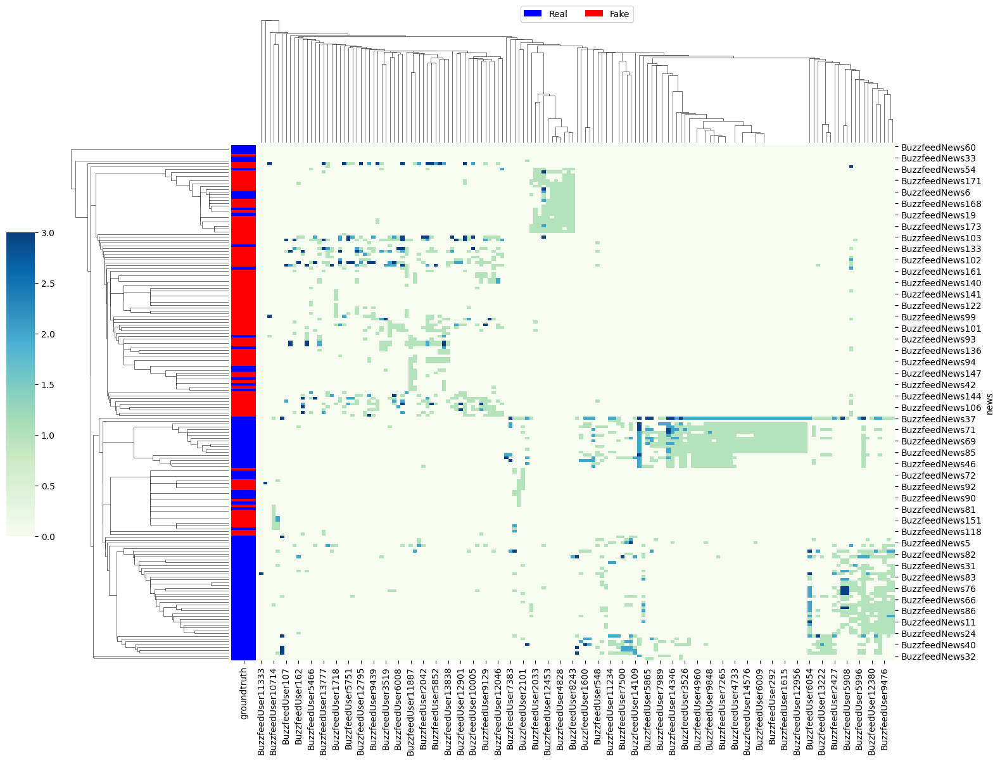

In [276]:
# WARNING: vmax is set as the number of maximum times a piece of news has been shared, change accordingly!

# Check https://data-newbie.tistory.com/564?category=780534
# Check https://stackoverflow.com/a/27992943

heatmap_labels = bit_matrix_buzz_subset["groundtruth"]
heatmap_lut = {"Real": "blue", "Fake": "red"}
heatmap_colors = bit_matrix_buzz_subset["groundtruth"].map(heatmap_lut)

h = sns.clustermap(
    bit_matrix_buzz_subset.drop("groundtruth", axis=1),
    method="single",
    metric="jaccard",
    row_cluster=True,
    figsize=(15, 12),
    # dendrogram_ratio=(.1, .2),
    row_colors=heatmap_colors,
    # col_colors=heatmap_colors,
    cbar_pos=(-0.05, .3, .03, .4),
    cmap="GnBu",
    vmin=0,
    vmax=3 # Number of maximum times a piece of news has been shared, change accordingly!
)

for label in heatmap_labels.unique():
    h.ax_col_dendrogram.bar(
        0,
        0,
        color=heatmap_lut[label],
        label=label,
        linewidth=0
    )

h.ax_col_dendrogram.legend(
    loc="center",
    ncol=len(heatmap_lut.keys()),
    bbox_to_anchor=(0.5, 1.0)
)

In [ ]:
# One group of users (bottom right) is sharing almost exclusively real news
# Another group of users (around the middle, news 37 to 46) is sharing only real news
# Another group can be found at the top with shared real and fake news (news from 54 to 173)
# There is a disperse group of users that is almost exclusively sharing fake news (users from 107 to 7383)

news,BuzzfeedNews1,BuzzfeedNews10,BuzzfeedNews100,BuzzfeedNews101,BuzzfeedNews102,BuzzfeedNews103,BuzzfeedNews104,BuzzfeedNews105,BuzzfeedNews106,BuzzfeedNews107,...,BuzzfeedNews91,BuzzfeedNews92,BuzzfeedNews93,BuzzfeedNews94,BuzzfeedNews95,BuzzfeedNews96,BuzzfeedNews97,BuzzfeedNews98,BuzzfeedNews99,Cluster
sharingUser,,,,,,,,,,,,,,,,,,,,,
BuzzfeedUser10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C2
BuzzfeedUser10005,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C0
BuzzfeedUser1001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,C2
BuzzfeedUser10010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C0
BuzzfeedUser10014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BuzzfeedUser9984,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C2
BuzzfeedUser9989,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C2
BuzzfeedUser9992,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,C2


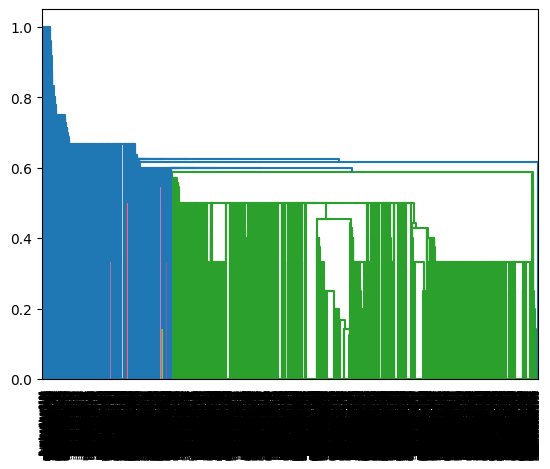

In [74]:
# Extract clusters: https://stackoverflow.com/a/31167710

from collections import defaultdict


def get_cluster_classes(den, label='ivl'):
    cluster_idxs = defaultdict(list)
    for c, pi in zip(den['color_list'], den['icoord']):
        for leg in pi[1:3]:
            i = (leg - 5.0) / 10.0
            if abs(i - int(i)) < 1e-5:
                cluster_idxs[c].append(int(i))

    cluster_classes = {}
    for c, l in cluster_idxs.items():
        i_l = [den[label][i] for i in l]
        cluster_classes[c] = i_l

    return cluster_classes


den = scipy.cluster.hierarchy.dendrogram(
    h.dendrogram_row.linkage,
    labels=bit_matrix_buzz.index,
    color_threshold=0.60
)
clusters = get_cluster_classes(den)

cluster = []
for i in bit_matrix_buzz.index:
    included=False
    for j in clusters.keys():
        if i in clusters[j]:
            cluster.append(j)
            included=True
    if not included:
        cluster.append(None)

bit_matrix_buzz["Cluster"] = cluster
bit_matrix_buzz

In [75]:
# Get number of users per cluster
bit_matrix_buzz["Cluster"].value_counts()

C2    2760
C0     461
C6      77
C8      70
C4      55
C5      52
C1      50
C9      47
C7      42
C3      37
Name: Cluster, dtype: int64

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_6480/3378754893.py:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



<AxesSubplot: >

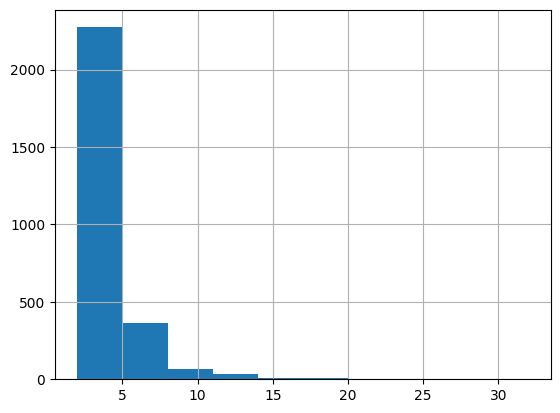

In [76]:
# Go cluster by cluster and check the distribution of timesShared
bit_matrix_buzz[bit_matrix_buzz["Cluster"] == "C2"].sum(axis=1).hist()

#### Distribution of labels per cluster

In [77]:
bit_matrix_buzz_label = pd.merge(
    left=bit_matrix_buzz.T,
    right=news_df[["news", "groundtruth"]],
    on="news",
    how="left"
)

# Get cluster row
cluster_row = bit_matrix_buzz_label[
    bit_matrix_buzz_label["news"] == "Cluster"
]

# Format cluster row
cluster_row = cluster_row.filter(regex="User").T
cluster_row.columns = ["Cluster"]

# Get counts per cluster
cluster_df = pd.DataFrame()

for cluster in bit_matrix_buzz["Cluster"].unique():
    # Get users for that cluster
    users = cluster_row[cluster_row["Cluster"] == cluster].index.tolist()

    # Get labels for those users
    labels = bit_matrix_buzz_label[users + ["groundtruth"]].dropna()

    # Drop news that do not belong to any user
    labels = labels[labels.filter(regex="User").any(axis=1)]
    
    print(cluster, len(users), labels.shape)

    label_counts = labels["groundtruth"]\
        .value_counts()\
        .to_frame()\
        .reset_index()\
        .rename(columns={
            "groundtruth": "Counts",
            "index": "Ground truth"
        })
    label_counts["Cluster"] = cluster

    cluster_df = pd.concat(
        [cluster_df, label_counts],
        axis=0,
        ignore_index=True
    )

cluster_df

C2 2760 (151, 2761)
C0 461 (176, 462)
C7 42 (43, 43)
C6 77 (69, 78)
C1 50 (55, 51)
C9 47 (42, 48)
C8 70 (86, 71)
C5 52 (44, 53)
C4 55 (21, 56)
C3 37 (29, 38)


,Ground truth,Counts,Cluster
0,Real,78,C2
1,Fake,73,C2
2,Real,89,C0
3,Fake,87,C0
4,Real,34,C7
5,Fake,9,C7
6,Real,42,C6
7,Fake,27,C6
8,Fake,28,C1
9,Real,27,C1


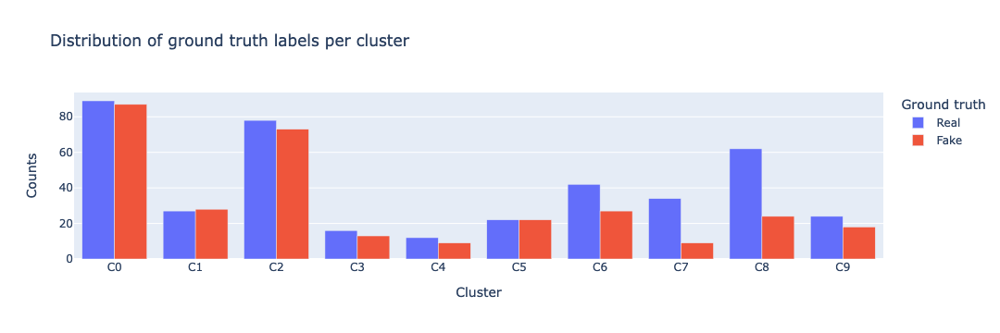

In [78]:
px.bar(
    data_frame=cluster_df,
    x="Cluster",
    y="Counts",
    color="Ground truth",
    barmode="group",
    category_orders={
        "Ground truth": ["Real", "Fake"],
        "Cluster": cluster_df["Cluster"].sort_values()
    },
    title="Distribution of ground truth labels per cluster"
)

In [79]:
# Select dataset
bit_matrix_poli = merged_df_grouped[
    merged_df_grouped["dataset"] == "Data2"
]

# Create the matrix
bit_matrix_poli = bit_matrix_poli.pivot(
    index="sharingUser",
    columns="news",
    values="timesShared"
)

# Fill NaNs with zeroes
bit_matrix_poli = bit_matrix_poli\
    .fillna(0.0)

# To get similar users that shared at least once the same piece of news,
# replace all non-zero values by 1. Otherwise, leave it unchanged
# bit_matrix_buzz = bit_matrix_buzz.where(
#     cond=bit_matrix_buzz == 0.0,
#     other=1.0
# )

# Remove users with onyl one piece of news
bit_matrix_poli = bit_matrix_poli[bit_matrix_poli.sum(axis=1) > 1]

bit_matrix_poli

news,PolitifactNews1,PolitifactNews10,PolitifactNews100,PolitifactNews101,PolitifactNews102,PolitifactNews103,PolitifactNews104,PolitifactNews105,PolitifactNews106,PolitifactNews107,...,PolitifactNews90,PolitifactNews91,PolitifactNews92,PolitifactNews93,PolitifactNews94,PolitifactNews95,PolitifactNews96,PolitifactNews97,PolitifactNews98,PolitifactNews99
sharingUser,,,,,,,,,,,,,,,,,,,,,
PolitifactUser10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PolitifactUser100,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PolitifactUser10001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PolitifactUser10002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PolitifactUser10003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PolitifactUser9980,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PolitifactUser9987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PolitifactUser9988,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


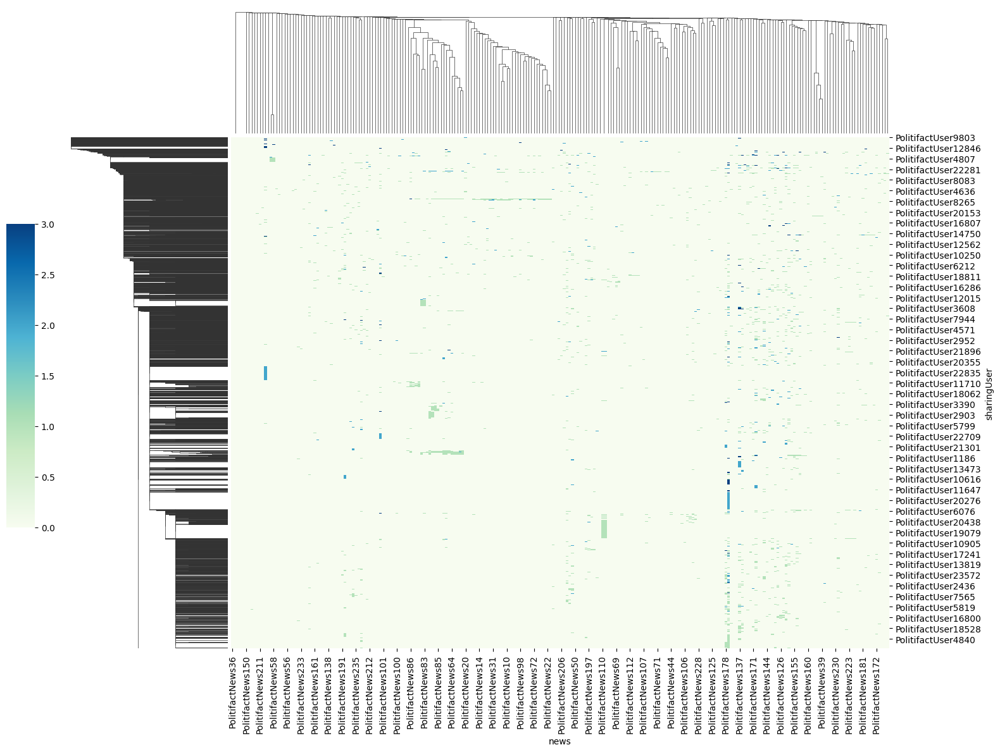

In [80]:
h = sns.clustermap(
    bit_matrix_poli,
    method="single",
    metric="jaccard",
    row_cluster=True,
    figsize=(15, 12),
    # dendrogram_ratio=(.1, .2),
    cbar_pos=(-0.05, .3, .03, .4),
    cmap="GnBu",
    vmin=0,
    vmax=3
)

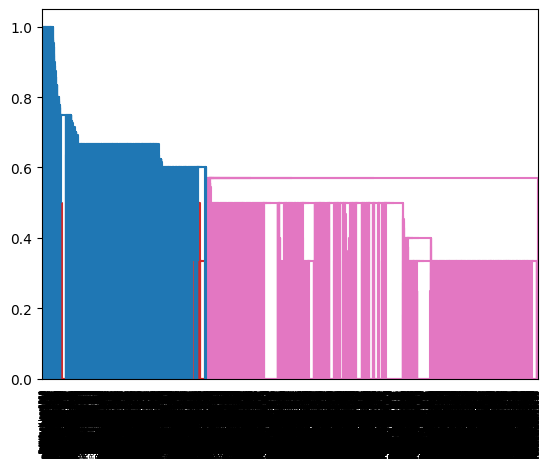

In [81]:
den = scipy.cluster.hierarchy.dendrogram(
    h.dendrogram_row.linkage,
    labels=bit_matrix_poli.index,
    color_threshold=0.60
)
clusters = get_cluster_classes(den)

cluster = []
for i in bit_matrix_poli.index:
    included=False
    for j in clusters.keys():
        if i in clusters[j]:
            cluster.append(j)
            included=True
    if not included:
        cluster.append(None)

bit_matrix_poli["Cluster"] = cluster

In [82]:
# Get number of users per cluster
bit_matrix_poli["Cluster"].value_counts()

C6    3609
C0     942
C3     217
C2      97
C1      84
C7      80
C8      80
C9      78
C5      67
C4      65
Name: Cluster, dtype: int64

In [83]:
bit_matrix_poli_label = pd.merge(
    left=bit_matrix_poli.T,
    right=news_df[["news", "groundtruth"]],
    on="news",
    how="left"
)

# Get cluster row
cluster_row = bit_matrix_poli_label[
    bit_matrix_poli_label["news"] == "Cluster"
]

# Format cluster row
cluster_row = cluster_row.filter(regex="User").T
cluster_row.columns = ["Cluster"]

# Get counts per cluster
cluster_df = pd.DataFrame()

for cluster in bit_matrix_poli["Cluster"].unique():
    # Get users for that cluster
    users = cluster_row[cluster_row["Cluster"] == cluster].index.tolist()

    # Get labels for those users
    labels = bit_matrix_poli_label[users + ["groundtruth"]].dropna()

    # Drop news that do not belong to any user
    labels = labels[labels.filter(regex="User").any(axis=1)]
    
    print(cluster, len(users), labels.shape)

    label_counts = labels["groundtruth"]\
        .value_counts()\
        .to_frame()\
        .reset_index()\
        .rename(columns={
            "groundtruth": "Counts",
            "index": "Ground truth"
        })
    label_counts["Cluster"] = cluster

    cluster_df = pd.concat(
        [cluster_df, label_counts],
        axis=0,
        ignore_index=True
    )

cluster_df

C6 3609 (187, 3610)
C4 65 (54, 66)
C2 97 (68, 98)
C0 942 (229, 943)
C5 67 (51, 68)
C3 217 (93, 218)
C7 80 (68, 81)
C1 84 (72, 85)
C9 78 (62, 79)
C8 80 (42, 81)


,Ground truth,Counts,Cluster
0,Fake,103,C6
1,Real,84,C6
2,Fake,39,C4
3,Real,15,C4
4,Fake,41,C2
5,Real,27,C2
6,Real,116,C0
7,Fake,113,C0
8,Fake,39,C5
9,Real,12,C5


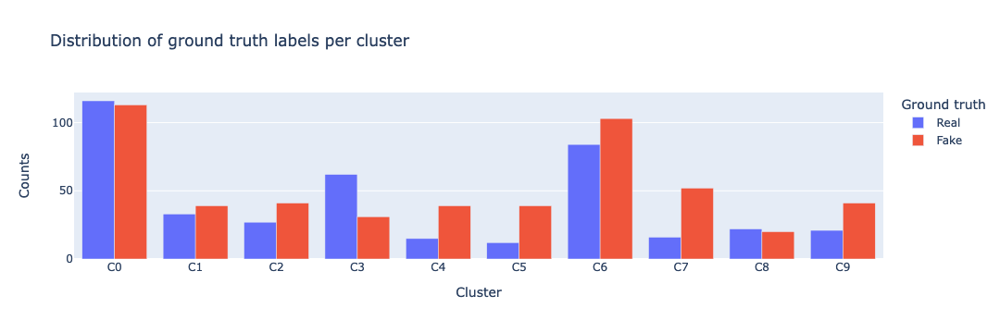

In [84]:
px.bar(
    data_frame=cluster_df,
    x="Cluster",
    y="Counts",
    color="Ground truth",
    barmode="group",
    category_orders={
        "Ground truth": ["Real", "Fake"],
        "Cluster": cluster_df["Cluster"].sort_values()
    },
    title="Distribution of ground truth labels per cluster"
)

In [85]:
from sklearn.metrics import pairwise_distances

jaccard_matrix = pairwise_distances(
    bit_matrix_poli\
        .filter(regex="News")\
        .astype(float)\
        .to_numpy(),
    metric="jaccard"
)

assert len(jaccard_matrix) == len(bit_matrix_poli), "Wrong dimensions!"

/Users/russo/miniconda3/envs/nobias/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning:

Data was converted to boolean for metric jaccard



In [86]:
jaccard_matrix = pd.DataFrame(
    jaccard_matrix,
    index=bit_matrix_poli.index,
    columns=bit_matrix_poli.index
)

jaccard_matrix

sharingUser,PolitifactUser10,PolitifactUser100,PolitifactUser10001,PolitifactUser10002,PolitifactUser10003,PolitifactUser10005,PolitifactUser10008,PolitifactUser10009,PolitifactUser1001,PolitifactUser10011,...,PolitifactUser9958,PolitifactUser9959,PolitifactUser9967,PolitifactUser9973,PolitifactUser9978,PolitifactUser9980,PolitifactUser9987,PolitifactUser9988,PolitifactUser9991,PolitifactUser9993
sharingUser,,,,,,,,,,,,,,,,,,,,,
PolitifactUser10,0.000000,1.0,1.0,1.0,0.333333,0.80,0.750000,1.0,0.8,0.750000,...,1.0,1.0,0.750000,1.0,0.500000,1.0,1.0,1.0,1.0,1.0
PolitifactUser100,1.000000,0.0,1.0,1.0,1.000000,1.00,1.000000,1.0,1.0,1.000000,...,1.0,1.0,1.000000,1.0,1.000000,1.0,1.0,1.0,1.0,1.0
PolitifactUser10001,1.000000,1.0,0.0,1.0,1.000000,1.00,1.000000,1.0,1.0,1.000000,...,1.0,1.0,1.000000,1.0,1.000000,1.0,1.0,1.0,1.0,1.0
PolitifactUser10002,1.000000,1.0,1.0,0.0,1.000000,1.00,1.000000,1.0,1.0,1.000000,...,1.0,1.0,1.000000,1.0,1.000000,1.0,0.5,1.0,1.0,1.0
PolitifactUser10003,0.333333,1.0,1.0,1.0,0.000000,0.75,0.666667,1.0,1.0,0.666667,...,1.0,1.0,0.666667,1.0,0.333333,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PolitifactUser9980,1.000000,1.0,1.0,1.0,1.000000,1.00,1.000000,1.0,1.0,1.000000,...,1.0,1.0,1.000000,1.0,1.000000,0.0,1.0,1.0,1.0,1.0
PolitifactUser9987,1.000000,1.0,1.0,0.5,1.000000,1.00,1.000000,1.0,1.0,1.000000,...,1.0,1.0,1.000000,1.0,1.000000,1.0,0.0,1.0,1.0,1.0
PolitifactUser9988,1.000000,1.0,1.0,1.0,1.000000,1.00,1.000000,1.0,1.0,1.000000,...,1.0,1.0,1.000000,1.0,1.000000,1.0,1.0,0.0,0.0,1.0


In [87]:
convg_df = pd.read_csv(
    "data/data_old/convergenceanalysis.csv", dtype={0:'string',1:'string',2:'string',3:'string'}
)
convg_df['rva']=convg_df['rva'][:].str.replace("https://nobias-project.eu/RandomVariableAtom/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_6480/1165335528.py:4: FutureWarning:

The default value of regex will change from True to False in a future version.



In [88]:
convg_df

,rva,AtomName,Type,Credibility,lastValue,convergencePoint
0,RVA5710,FAKENEWS(BuzzFeed_Fake_89),News,NotCredible,0.903,33
1,RVA778,FAKENEWS(BuzzFeed_Real_46),News,Credible,0.146,33
2,RVA9558,FAKENEWS(BuzzFeed_Fake_4),News,NotCredible,0.938,34
3,RVA8356,FAKENEWS(BuzzFeed_Fake_51),News,NotCredible,0.922,33
4,RVA8355,FAKENEWS(BuzzFeed_Fake_60),News,NotCredible,0.774,34
...,...,...,...,...,...,...
15168,RVA4698,PUBCREDLAT(http://usherald.com),Publisher,NotCredible,0.000,8
15169,RVA4309,PUBCREDLAT(http://allenwestrepublic.com),Publisher,NotCredible,0.000,10
15170,RVA4189,PUBCREDLAT(http://chicksontheright.com),Publisher,NotCredible,0.000,10
15171,RVA14551,PUBCREDLAT(http://yesimright.com),Publisher,NotCredible,0.000,12


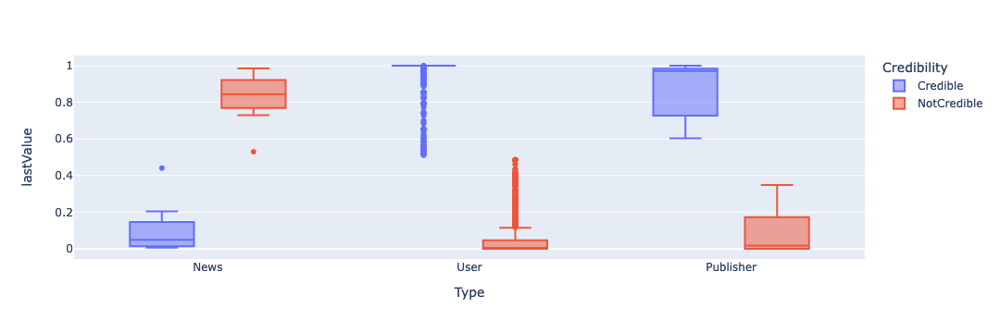

In [89]:
fig = px.box(convg_df, y="lastValue", x='Type', color="Credibility",hover_data=['AtomName'],category_orders={
        "Credibility": ["Credible", "NotCredible"]}
            )

fig.show()

In [90]:
convg_df['lastValue'].describe()

count    15173.000000
mean         0.497575
std          0.477942
min          0.000000
25%          0.000000
50%          0.354000
75%          1.000000
max          1.000000
Name: lastValue, dtype: float64

In [91]:
convg_df['convergencePoint'].describe()

count    15173.000000
mean        12.433533
std         10.540439
min          2.000000
25%          7.000000
50%          9.000000
75%         10.000000
max         34.000000
Name: convergencePoint, dtype: float64

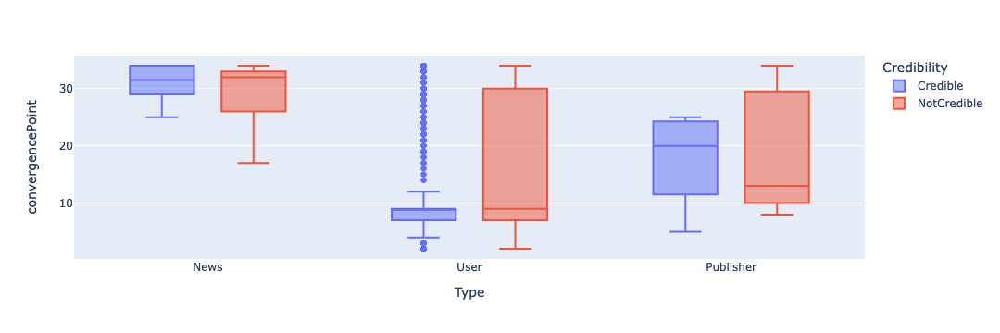

In [92]:
fig = px.box(convg_df, y="convergencePoint", x='Type', color="Credibility",category_orders={
        "Credibility": ["Credible", "NotCredible"]})

fig.show()

In [96]:
weights_df = pd.read_csv(
    "data/newsConstraints.csv"
)
weights_df

,Unnamed: 0,NewsID,news_cred,UserConstraintPercentage,PublisherConstraintPercentage
0,0,BuzzFeed_Fake_12,0.530,94.045151,5.954849
1,1,BuzzFeed_Fake_15,0.946,99.546533,0.453467
2,2,BuzzFeed_Fake_27,0.850,93.426991,6.573009
3,3,BuzzFeed_Fake_28,0.855,95.672916,4.327084
4,4,BuzzFeed_Fake_31,0.865,99.615393,0.384607
5,5,BuzzFeed_Fake_4,0.938,99.848386,0.151614
6,6,BuzzFeed_Fake_51,0.922,99.737954,0.262046
7,7,BuzzFeed_Fake_53,0.958,98.612434,1.387566
8,8,BuzzFeed_Fake_6,0.824,90.454210,9.545790
9,9,BuzzFeed_Fake_60,0.774,99.595750,0.404250


In [105]:
weights_df_long = weights_df.melt(
    id_vars=[
        "NewsID",
        "news_cred"
    ],
    value_vars=[
        "UserConstraintPercentage",
        "PublisherConstraintPercentage"
    ],
    var_name="Type",
    value_name="WeightContribution"
)

weights_df_long["GroundTruth"] = weights_df_long["NewsID"].str.split("_").str[1]
weights_df_long

,NewsID,news_cred,Type,WeightContribution,GroundTruth
0,BuzzFeed_Fake_12,0.530,UserConstraintPercentage,94.045151,Fake
1,BuzzFeed_Fake_15,0.946,UserConstraintPercentage,99.546533,Fake
2,BuzzFeed_Fake_27,0.850,UserConstraintPercentage,93.426991,Fake
3,BuzzFeed_Fake_28,0.855,UserConstraintPercentage,95.672916,Fake
4,BuzzFeed_Fake_31,0.865,UserConstraintPercentage,99.615393,Fake
...,...,...,...,...,...
67,BuzzFeed_Real_73,0.009,PublisherConstraintPercentage,0.295010,Real
68,BuzzFeed_Real_81,0.051,PublisherConstraintPercentage,1.329305,Real
69,BuzzFeed_Real_84,0.098,PublisherConstraintPercentage,1.940327,Real
70,BuzzFeed_Real_86,0.014,PublisherConstraintPercentage,0.922572,Real


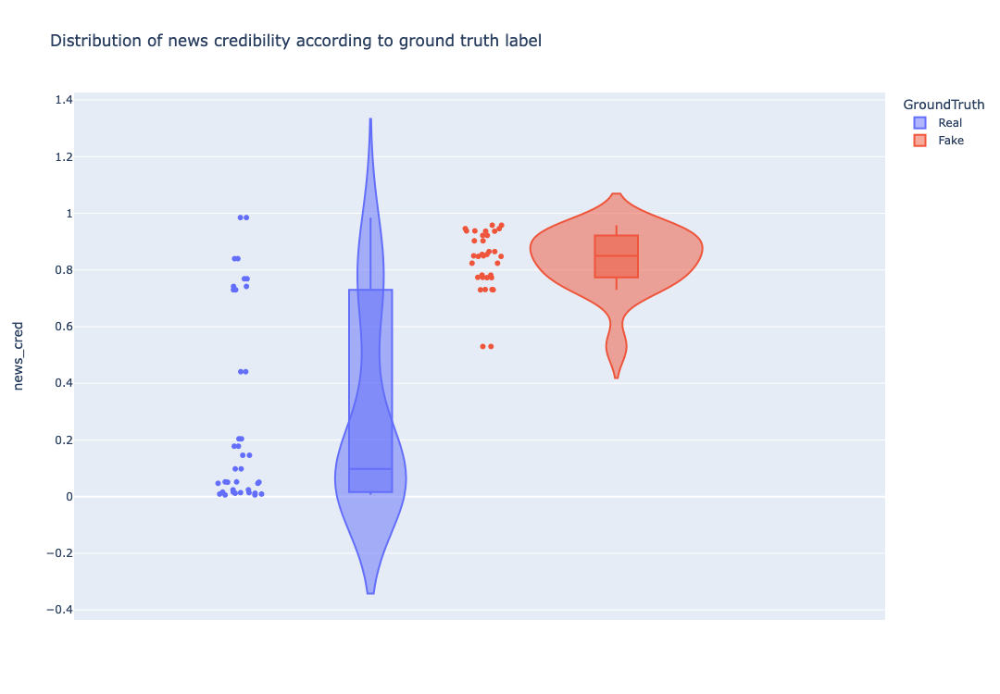

In [123]:
# There are some real news that are being missclassified (news_cred > 0.5).
# Check whether there are more fake news instances (pairs of user-news) that
# is biasing the model to classify correctly the fake ones.

px.violin(
    data_frame=weights_df_long,
    y="news_cred",
    color="GroundTruth",
    hover_data=["NewsID"],
    category_orders={
        "GroundTruth": [
            "Real",
            "Fake"
        ]
    },
    box=True,
    points="all",
    height=750,
    width=900,
    title="Distribution of news credibility according to ground truth label"
)

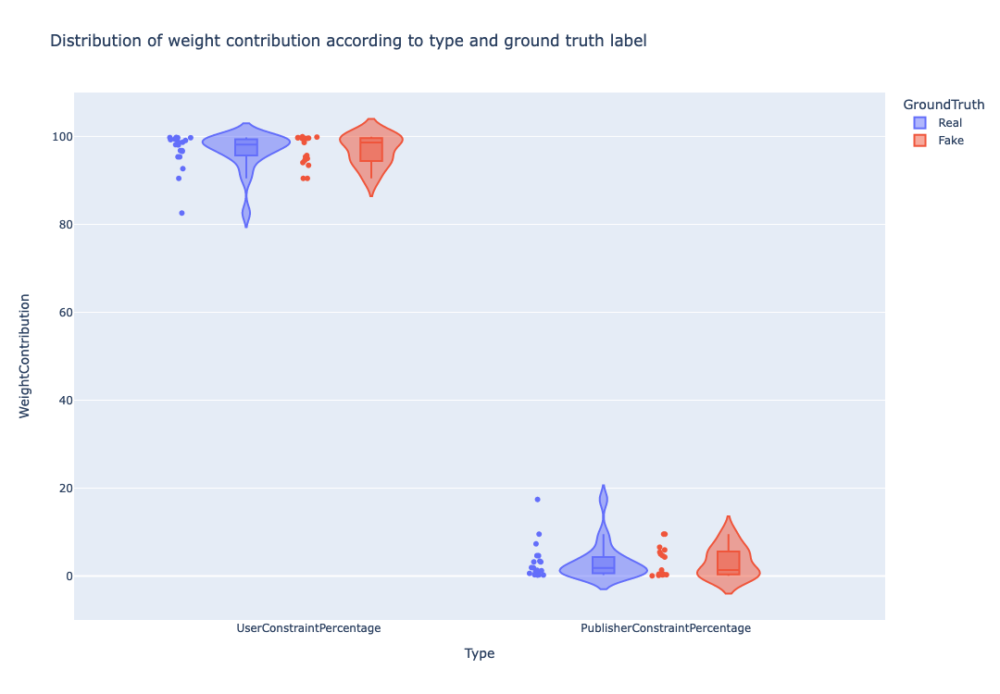

In [124]:
# The weight of users is on average way more that the publishers',
# indicating that publishers are not contributing to the classification.

px.violin(
    data_frame=weights_df_long,
    x="Type",
    y="WeightContribution",
    color="GroundTruth",
    hover_data=["NewsID"],
    category_orders={
        "GroundTruth": [
            "Real",
            "Fake"
        ]
    },
    box=True,
    points="all",
    height=750,
    width=900,
    title="Distribution of weight contribution according to type and ground truth label"
)

I have a list of users (high jacc index) and what do I want with it? 


In [301]:
buzz_bias_df = pd.read_csv(
    "data/in_group_biased_Buzzfeed.csv"
)

buzz_bias_df["UserID"] = buzz_bias_df["UserID"].str.split("/").str[-1]

buzz_bias_df = merged_df_grouped[
    merged_df_grouped["sharingUser"].isin(buzz_bias_df["UserID"].to_numpy())
]
buzz_bias_df

,news,sharingUser,publisher,groundtruth,dataset,timesShared
1,BuzzfeedNews1,BuzzfeedUser10351,Publisher12,Real,Data1,1
6,BuzzfeedNews1,BuzzfeedUser3185,Publisher12,Real,Data1,1
7,BuzzfeedNews1,BuzzfeedUser3519,Publisher12,Real,Data1,1
10,BuzzfeedNews1,BuzzfeedUser7040,Publisher12,Real,Data1,1
12,BuzzfeedNews1,BuzzfeedUser8597,Publisher12,Real,Data1,1
...,...,...,...,...,...,...
22751,BuzzfeedNews99,BuzzfeedUser2763,Publisher1,Fake,Data1,1
22752,BuzzfeedNews99,BuzzfeedUser3152,Publisher1,Fake,Data1,1
22761,BuzzfeedNews99,BuzzfeedUser5490,Publisher1,Fake,Data1,1
22762,BuzzfeedNews99,BuzzfeedUser5674,Publisher1,Fake,Data1,2


In [302]:
# Global
buzz_bias_df.groupby("groundtruth")["timesShared"].mean()

groundtruth
Fake    1.181671
Real    1.139284
Name: timesShared, dtype: float64

In [316]:
groundtruth_matrix_buzz = buzz_bias_df.pivot(
    index="sharingUser",
    columns="news",
    values="groundtruth"
)

# Fill NaNs with zeroes
groundtruth_matrix_buzz = groundtruth_matrix_buzz\
    .fillna(0.0)

# Replace fake by -1, real by 1
groundtruth_matrix_buzz = groundtruth_matrix_buzz.replace({
    "Real": +1.0,
    "Fake": -1.0
})

groundtruth_matrix_buzz["GroundTruthSum"] = groundtruth_matrix_buzz.sum(axis=1)

groundtruth_matrix_buzz

news,BuzzfeedNews1,BuzzfeedNews10,BuzzfeedNews101,BuzzfeedNews102,BuzzfeedNews103,BuzzfeedNews104,BuzzfeedNews105,BuzzfeedNews106,BuzzfeedNews107,BuzzfeedNews108,...,BuzzfeedNews9,BuzzfeedNews91,BuzzfeedNews93,BuzzfeedNews94,BuzzfeedNews95,BuzzfeedNews96,BuzzfeedNews97,BuzzfeedNews98,BuzzfeedNews99,GroundTruthSum
sharingUser,,,,,,,,,,,,,,,,,,,,,
BuzzfeedUser10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0
BuzzfeedUser1001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,-4.0
BuzzfeedUser10036,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0
BuzzfeedUser1004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
BuzzfeedUser10052,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BuzzfeedUser9910,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.0
BuzzfeedUser9961,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0
BuzzfeedUser9973,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0


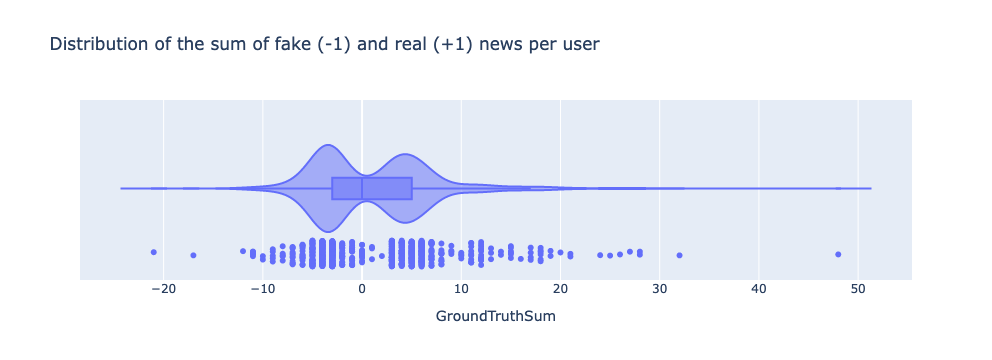

In [322]:
px.violin(
    data_frame=groundtruth_matrix_buzz,
    x="GroundTruthSum",
    hover_data=[groundtruth_matrix_buzz.index],
    box=True,
    points="all",
    title="Distribution of the sum of fake (-1) and real (+1) news per user"
)

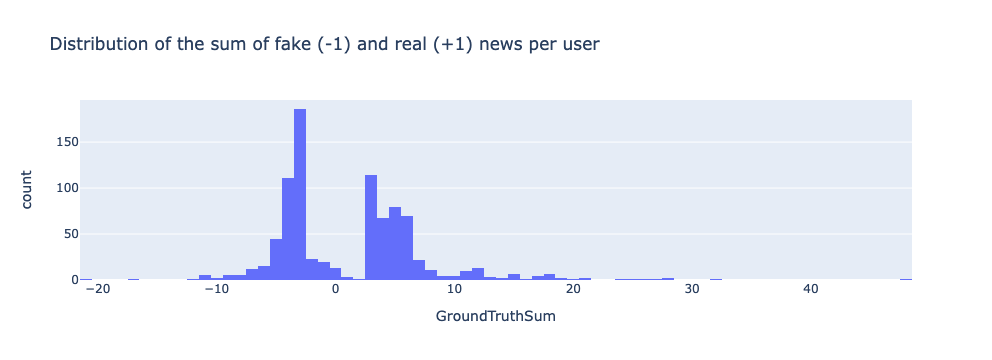

In [323]:
px.histogram(
    data_frame=groundtruth_matrix_buzz,
    x="GroundTruthSum",
    hover_data=[groundtruth_matrix_buzz.index],
    title="Distribution of the sum of fake (-1) and real (+1) news per user"
)